<a href="https://colab.research.google.com/github/escuccim/vaegan-pytorch/blob/master/VAEGAN_ResNet_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Versions:
 - 1:
     - 1/a : architecture was bad
     - b : architecture is fine, working
     - c : adding loss to decoder to try to match aux outputs, removing decoder loss from sampled to original because that makes no sense. **Update** - adding the aux loss to the decoder does seem to be helping, as does removing the mse_2 loss from the encoder, to which that loss had absolutely no relevance.
 - 2:
     - a : Added more parameters to decoder, including final transpose conv w/ stride 1 to try to smooth out artificacts
 - 3:
     - a : Changing decoder again to try to smooth out artificacts
     - b : I'm not totally sure about selectively not training the decoder or discriminator. I'm going to try to loosen the margin around equilibrium to see what happens.
     - c : adding more training images to avoid overfitting to the celeba dataset.

In [2]:
!nvidia-smi

Mon Nov 25 09:42:42 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.33.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P8    27W / 149W |      0MiB / 11441MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [3]:
import torch
import torchvision
from torch import nn
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt, colors
%matplotlib inline
import zipfile
import os
import matplotlib.animation as animation
import torchvision.utils as vutils
import numpy as np
import re
import random
import pandas as pd
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data import Dataset
from torch import Tensor
from torch.optim import RMSprop,Adam,SGD
from torch.optim.lr_scheduler import ExponentialLR,MultiStepLR
from torchvision.utils import make_grid
from torch.autograd import Variable
from torch.utils.data import Dataset
from torch.optim import RMSprop,Adam,SGD
from torch.optim.lr_scheduler import ExponentialLR,MultiStepLR
from torchvision.utils import make_grid
from sklearn.metrics import f1_score
import torchvision.utils as vutils
from collections import OrderedDict
from torch.hub import load_state_dict_from_url

from google.colab import auth
auth.authenticate_user()

# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'gan-faces'

!gcloud config set project {project_id}

Updated property [core/project].


In [0]:
model_save_path = "vaegan_resnet50_5a.pt"
disc_opt_save_path = "vaegan_resnet50_opt_disc_5a.pt"
enc_opt_save_path = "vaegan_resnet50_opt_enc_5a.pt"
dec_opt_save_path = "vaegan_resnet50_opt_dec_5a.pt"

In [5]:
if not os.path.exists(model_save_path):
  !gsutil cp gs://{bucket_name}/{model_save_path} ./{model_save_path} 
  !gsutil cp gs://{bucket_name}/{disc_opt_save_path} ./{disc_opt_save_path} 
  !gsutil cp gs://{bucket_name}/{dec_opt_save_path} ./{dec_opt_save_path} 
  !gsutil cp gs://{bucket_name}/{enc_opt_save_path} ./{enc_opt_save_path} 

Copying gs://gan-faces/vaegan_resnet50_5a.pt...
/ [1 files][216.3 MiB/216.3 MiB]                                                
Operation completed over 1 objects/216.3 MiB.                                    
Copying gs://gan-faces/vaegan_resnet50_opt_disc_5a.pt...
- [1 files][ 81.3 MiB/ 81.3 MiB]                                                
Operation completed over 1 objects/81.3 MiB.                                     
Copying gs://gan-faces/vaegan_resnet50_opt_dec_5a.pt...
- [1 files][ 51.6 MiB/ 51.6 MiB]                                                
Operation completed over 1 objects/51.6 MiB.                                     
Copying gs://gan-faces/vaegan_resnet50_opt_enc_5a.pt...
- [1 files][ 83.2 MiB/ 83.2 MiB]                                                
Operation completed over 1 objects/83.2 MiB.                                     


In [6]:
if not os.path.exists("celeba-dataset.zip"):
#   !kaggle datasets download -d jessicali9530/celeba-dataset
  !gsutil cp gs://{bucket_name}/celeba-dataset.zip ./celeba-dataset.zip
  zip_ref = zipfile.ZipFile('celeba-dataset.zip', 'r')
  zip_ref.extractall('data')
  zip_ref.close()

  zip_ref = zipfile.ZipFile('data/img_align_celeba.zip', 'r')
  zip_ref.extractall('data/images')
  zip_ref.close()

if not os.path.exists("imdb_crop_good.zip"):
  !gsutil cp gs://{bucket_name}/imdb_crop_good.zip ./ 
  zip_ref = zipfile.ZipFile('imdb_crop_good.zip', 'r')
  zip_ref.extractall('data/images/imdb_images')
  zip_ref.close()  

# if not os.path.exists("celeb_a_good.zip"):
# #   !kaggle datasets download -d jessicali9530/celeba-dataset
#   !gsutil cp gs://{bucket_name}/celeb_a_good.zip ./celeb_a_good.zip
#   zip_ref = zipfile.ZipFile('celeb_a_good.zip', 'r')
#   zip_ref.extractall('data/images/celeb_a')
#   zip_ref.close()

if not os.path.exists("Training_Pictures.zip"):
  !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
  zip_ref = zipfile.ZipFile('Training_Pictures.zip', 'r')
  zip_ref.extractall('data/images/training')
  zip_ref.close()

# if not os.path.exists("crop_part1_good.zip"):
#   !gsutil cp gs://{bucket_name}/crop_part1_good.zip ./crop_part1_good.zip
#   zip_ref = zipfile.ZipFile('crop_part1_good.zip', 'r')
#   zip_ref.extractall('data/images/crop_parta')
#   zip_ref.close()   

Copying gs://gan-faces/celeba-dataset.zip...
- [1 files][  1.2 GiB/  1.2 GiB]   71.6 MiB/s                                   
Operation completed over 1 objects/1.2 GiB.                                      
Copying gs://gan-faces/imdb_crop_good.zip...
- [1 files][829.6 MiB/829.6 MiB]   66.1 MiB/s                                   
Operation completed over 1 objects/829.6 MiB.                                    
--2019-11-25 09:45:11--  https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
Resolving s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)... 52.95.155.37
Connecting to s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)|52.95.155.37|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 955202 (933K) [application/zip]
Saving to: ‘Training_Pictures.zip’

Training_Pictures.z 100%[===================>] 932.81K  --.-KB/s    in 0.03s   

2019-11-25 09:45:11 (32.0 MB/s) - ‘Training_Pictures.zip’ saved [955202/955202]



In [7]:
if not os.path.exists("wiki_images_good.zip"):
  !gsutil cp gs://{bucket_name}/wiki_images_good.zip ./wiki_images_good.zip
  zip_ref = zipfile.ZipFile('wiki_images_good.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()  

Copying gs://gan-faces/wiki_images_good.zip...
- [1 files][ 94.7 MiB/ 94.7 MiB]                                                
Operation completed over 1 objects/94.7 MiB.                                     


In [0]:
model_urls = {
    'resnet18': 'https://download.pytorch.org/models/resnet18-5c106cde.pth',
    'resnet34': 'https://download.pytorch.org/models/resnet34-333f7ec4.pth',
    'resnet50': 'https://download.pytorch.org/models/resnet50-19c8e357.pth',
    'resnet101': 'https://download.pytorch.org/models/resnet101-5d3b4d8f.pth',
    'resnet152': 'https://download.pytorch.org/models/resnet152-b121ed2d.pth',
    'resnext50_32x4d': 'https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth',
    'resnext101_32x8d': 'https://download.pytorch.org/models/resnext101_32x8d-8ba56ff5.pth',
    'wide_resnet50_2': 'https://download.pytorch.org/models/wide_resnet50_2-95faca4d.pth',
    'wide_resnet101_2': 'https://download.pytorch.org/models/wide_resnet101_2-32ee1156.pth',
}

In [0]:
def masked_f1_score(outputs, labels):
    # mins, _ = labels.min(dim=1)
    mask = labels != -1
    f1 = f1_score(torch.squeeze(labels[mask].detach().cpu().float().view(-1)), torch.round(outputs[mask].detach().cpu().float().view(-1)), average="micro")
    return f1

def masked_accuracy(outputs, b_labels):
    mins, _ = b_labels.min(dim=1)
    mask = mins != -1
    accuracy = torch.mean((torch.round(outputs[mask].float()) == b_labels[mask].float()).float())
    return accuracy

# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [0]:
def conv3x3(in_planes, out_planes, stride=1, groups=1, dilation=1):
    """3x3 convolution with padding"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=dilation, groups=groups, bias=False, dilation=dilation)


def conv1x1(in_planes, out_planes, stride=1):
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


class BasicBlock(nn.Module):
    expansion = 1
    __constants__ = ['downsample']

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(BasicBlock, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        if groups != 1 or base_width != 64:
            raise ValueError('BasicBlock only supports groups=1 and base_width=64')
        if dilation > 1:
            raise NotImplementedError("Dilation > 1 not supported in BasicBlock")
        # Both self.conv1 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = norm_layer(planes)
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = norm_layer(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class Bottleneck(nn.Module):
    expansion = 4
    __constants__ = ['downsample']

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(Bottleneck, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        width = int(planes * (base_width / 64.)) * groups
        # Both self.conv2 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv1x1(inplanes, width)
        self.bn1 = norm_layer(width)
        self.conv2 = conv3x3(width, width, stride, groups, dilation)
        self.bn2 = norm_layer(width)
        self.conv3 = conv1x1(width, planes * self.expansion)
        self.bn3 = norm_layer(planes * self.expansion)
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out

class BasicBlock(nn.Module):
    expansion = 1
    __constants__ = ['downsample']

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(BasicBlock, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        if groups != 1 or base_width != 64:
            raise ValueError('BasicBlock only supports groups=1 and base_width=64')
        if dilation > 1:
            raise NotImplementedError("Dilation > 1 not supported in BasicBlock")
        # Both self.conv1 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = norm_layer(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = norm_layer(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out    
    
class BasicBlock2(nn.Module):
    expansion = 1
    __constants__ = ['downsample']

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(BasicBlock2, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        if groups != 1 or base_width != 64:
            raise ValueError('BasicBlock only supports groups=1 and base_width=64')
        if dilation > 1:
            raise NotImplementedError("Dilation > 1 not supported in BasicBlock")
        # Both self.conv1 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = norm_layer(planes)
        self.relu = nn.LeakyReLU(0.2, inplace=False)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = norm_layer(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
#         out = self.relu(out)

        return out
    
class Bottleneck2(nn.Module):
    expansion = 4
    __constants__ = ['downsample']

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(Bottleneck2, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        width = int(planes * (base_width / 64.)) * groups
        # Both self.conv2 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv1x1(inplanes, width)
        self.bn1 = norm_layer(width)
        self.conv2 = conv3x3(width, width, stride, groups, dilation)
        self.bn2 = norm_layer(width)
        self.conv3 = conv1x1(width, planes * self.expansion)
        self.bn3 = norm_layer(planes * self.expansion)
        
        self.relu = nn.LeakyReLU(0.2, inplace=False)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
#         out = self.bn3(c3)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
#         out = self.relu(out)

        return out
    
class ResNet(nn.Module):

    def __init__(self, block, layers, extra_block=None, num_classes=1000, zero_init_residual=False,
                 groups=1, width_per_group=64, replace_stride_with_dilation=None,
                 norm_layer=None):
        super(ResNet, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        self._norm_layer = norm_layer

        self.inplanes = 64
        self.dilation = 1
        if replace_stride_with_dilation is None:
            # each element in the tuple indicates if we should replace
            # the 2x2 stride with a dilated convolution instead
            replace_stride_with_dilation = [False, False, False]
        if len(replace_stride_with_dilation) != 3:
            raise ValueError("replace_stride_with_dilation should be None "
                             "or a 3-element tuple, got {}".format(replace_stride_with_dilation))
        self.groups = groups
        self.base_width = width_per_group
        self.conv1 = nn.Conv2d(3, self.inplanes, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = norm_layer(self.inplanes)
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.maxpool = nn.AvgPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2,
                                       dilate=replace_stride_with_dilation[0])
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2,
                                       dilate=replace_stride_with_dilation[1])
        if extra_block is not None:
            self.layer4 = self._make_layer(extra_block, 512, layers[3], stride=2,
                                       dilate=replace_stride_with_dilation[2])
        else:
            self.layer4 = self._make_layer(block, 512, layers[3], stride=2,
                                       dilate=replace_stride_with_dilation[2])
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        
        self.fc = nn.Linear(512 * block.expansion, num_classes)
        
        self.relu = nn.LeakyReLU(0.2, inplace=False)
        
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, (nn.BatchNorm2d, nn.GroupNorm)):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def _make_layer(self, block, planes, blocks, stride=1, dilate=False):
        norm_layer = self._norm_layer
        downsample = None
        previous_dilation = self.dilation
        if dilate:
            self.dilation *= stride
            stride = 1
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                conv1x1(self.inplanes, planes * block.expansion, stride),
                norm_layer(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample, self.groups,
                            self.base_width, previous_dilation, norm_layer))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes, groups=self.groups,
                                base_width=self.base_width, dilation=self.dilation,
                                norm_layer=norm_layer))

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        fm = self.layer4(x)
        x = self.relu(fm)

        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x, feature_map=fm)

        return x


def _resnet(arch, block, layers, pretrained, progress, extra_block, **kwargs):
    model = ResNet(block, layers, extra_block, **kwargs)
    if pretrained:
        state_dict = load_state_dict_from_url(model_urls[arch],
                                              progress=progress)
        model.load_state_dict(state_dict)
    return model

def resnet34(pretrained=False, progress=True, **kwargs):
    r"""ResNet-34 model from
    `"Deep Residual Learning for Image Recognition" <https://arxiv.org/pdf/1512.03385.pdf>`_
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
    """
    return _resnet('resnet34', BasicBlock, [3, 4, 6, 3], pretrained, progress, extra_block=BasicBlock2,
                   **kwargs)


def resnet50(pretrained=False, progress=True, **kwargs):
    r"""ResNet-50 model from
    `"Deep Residual Learning for Image Recognition" <https://arxiv.org/pdf/1512.03385.pdf>`_
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
    """
    return _resnet('resnet50', Bottleneck, [3, 4, 6, 3], pretrained, progress, extra_block=None,
                   **kwargs)


In [0]:
class Decoder(nn.Module):
    def __init__(self, latent_dim=256, ngf=48, ngpu=1):
        super(Decoder, self).__init__()
        self.ngpu = ngpu
        self.c1 = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( latent_dim, ngf * 16, 5, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.LeakyReLU(0.2, inplace=False)
        )
        self.c2 = nn.Sequential(
            # state size. (ngf*8) x 5 x 5
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.LeakyReLU(0.2, inplace=False)
        )

        self.c3 = nn.Sequential(
            # state size. (ngf*4) x 10 x 10
            nn.ConvTranspose2d( ngf * 8, ngf * 6, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 6),
            nn.LeakyReLU(0.2, inplace=False)
        )
        self.c4 = nn.Sequential(
            # state size. (ngf*2) x 20 x 20
            nn.ConvTranspose2d( ngf * 6, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.LeakyReLU(0.2, inplace=False)
        )

        self.c5 = nn.Sequential(
            # state size. (ngf) x 40 x 40
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.LeakyReLU(0.2, inplace=False)
        )

        self.c6 = nn.Sequential(
            # state size. (ngf) x 80 x 80
            nn.ConvTranspose2d( ngf * 2, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        b_size = input.shape[0]
        x = self.c1(input.view(b_size, -1, 1, 1))
        x = self.c2(x)
        x = self.c3(x)
        x = self.c4(x)
        x = self.c5(x)
        x = self.c6(x)

        return x

In [0]:
class DiscriminatorOutput(nn.Module):
    def __init__(self, num_ftrs):
        super(DiscriminatorOutput, self).__init__()
        
        # Two FC Layers to output discriminator and aux output
        self.discriminator = nn.Sequential(
#             nn.Linear(num_ftrs, 1536),
#             nn.BatchNorm1d(num_features=1536),
#             nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(num_ftrs, 1)
        )
        self.aux = nn.Sequential(
#             nn.Linear(num_ftrs, 1536),
#             nn.BatchNorm1d(num_features=1536),
#             nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(num_ftrs, 40)
        )
        self.bn = nn.BatchNorm1d(num_ftrs)
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, features, feature_map=None):
        features = self.bn(features)
        output = self.discriminator(features)
        aux_output = self.aux(features)
        return self.sigmoid(output), feature_map, self.sigmoid(aux_output)
    
class EncoderOutput(nn.Module):
    def __init__(self, num_ftrs, latent_dim=256):
        super(EncoderOutput, self).__init__()
        # Two FC Layers to output code and logvar
        self.code = nn.Linear(num_ftrs, latent_dim)
        self.logvar = nn.Linear(num_ftrs, latent_dim)
        
    def forward(self, features, feature_map=None):
        code = self.code(features)
        logvar = self.logvar(features)
        return code, logvar    

In [0]:
class VaeGan(nn.Module):
    def __init__(self,z_size=128,recon_level=5, pretrained=True):
        super(VaeGan, self).__init__()
        # latent space size
        self.z_size = z_size
        
        self.encoder = resnet34(pretrained=pretrained)
#         num_ftrs = self.encoder.classifier.in_features
#         self.encoder.final_conv = DownsizeBlock(num_ftrs)
        self.encoder.fc = EncoderOutput(num_ftrs=512, latent_dim=z_size)

        self.decoder = Decoder(latent_dim=self.z_size, ngf=40)
        
        self.discriminator = resnet34(pretrained=pretrained)
#         self.discriminator.avgpool = nn.AdaptiveAvgPool2d((2, 2))
#         num_ftrs = self.discriminator.classifier.in_features
        self.discriminator.fc = DiscriminatorOutput(num_ftrs=512)
    
        # self-defined function to init the parameters
        self.init_parameters()

    def init_parameters(self):
        # just explore the network, find every weight and bias matrix and fill it
        for m in self.modules():
            classname = m.__class__.__name__
            if classname.find('Conv') != -1:
                nn.init.normal_(m.weight.data, 0.0, 0.02)
            elif classname.find('BatchNorm') != -1:
                nn.init.normal_(m.weight.data, 1.0, 0.02)
                nn.init.constant_(m.bias.data, 0)  

    def forward(self, ten, gen_size=10, output_samples=False):
        if self.training:
            # save the original images
            ten_original = ten
            
            # encode
            mus, log_variances = self.encoder(ten)

            # we need the true variances, not the log one
            variances = torch.exp(log_variances * 0.5)
            
            # sample from a gaussian
            ten_from_normal = Variable(torch.randn(len(ten), self.z_size).cuda(), requires_grad=True)
            
            # shift and scale using the means and variances
            ten = ten_from_normal * variances + mus

            # decode the tensor
            ten = self.decoder(ten)
            
            ten_from_normal = Variable(torch.randn(len(ten), self.z_size).cuda(), requires_grad=True)
            ten_from_normal = self.decoder(ten_from_normal)
            
            disc_out, fm, aux_out = self.discriminator(torch.cat((ten, ten_original, ten_from_normal), 0))

            if output_samples:
              ten = torch.cat((ten, ten_from_normal), 0)
            return ten, disc_out, aux_out, fm, mus, log_variances

        else:
            if ten is None:
                # just sample and decode
                ten = Variable(torch.randn(gen_size, self.z_size).cuda(), requires_grad=False)
                ten = self.decoder(ten)
            else:
                mus, log_variances = self.encoder(ten)
                
                ten_from_normal = Variable(torch.randn(len(ten), self.z_size).cuda(), requires_grad=False)
                
                # we'll just use the mean, ignoring the variance
                ten = mus

                # decode the tensor
                ten = self.decoder(torch.cat((ten, ten_from_normal), 0))
            return ten
   
    @staticmethod
    def weighted_bce(outputs, labels):
        mins, _ = labels.min(dim=1)
        mask = mins != -1
        criterion = torch.nn.BCELoss(reduction="sum")
        loss = criterion(torch.squeeze(outputs[mask]), labels[mask])
#         weights = labels + 0.5
        weights = 1
        loss = (loss * weights).mean()
        return loss

    
    @staticmethod
    def loss(ten_original, ten_predicted, layer_original, layer_predicted, layer_sampled, labels_original,
             labels_predicted, labels_sampled, mus, variances, aux_out, aux_out_recon, aux_labels):
        """
        :param ten_original: original images
        :param ten_predicted:  predicted images (output of the decoder)
        :param layer_original:  intermediate layer for original (intermediate output of the discriminator)
        :param layer_predicted: intermediate layer for reconstructed (intermediate output of the discriminator)
        :param labels_original: labels for original (output of the discriminator)
        :param labels_predicted: labels for reconstructed (output of the discriminator)
        :param labels_sampled: labels for sampled from gaussian (0,1) (output of the discriminator)
        :param mus: tensor of means
        :param variances: tensor of diagonals of log_variances
        :return:
        """

        # reconstruction error, not used for the loss but useful to evaluate quality
        nle = 0.5*(ten_original.view(len(ten_original), -1) - ten_predicted.view(len(ten_predicted), -1)) ** 2
        
        # kl-divergence
        kl = -0.5 * torch.sum(-variances.exp() - torch.pow(mus,2) + variances + 1, 1)
        
        # mse between intermediate layers for both
        mse_1 = torch.sum(1.0*(layer_original - layer_predicted) ** 2, 1) / 2.
        mse_2 = torch.Tensor([0]) #torch.sum(0.5*(layer_original - layer_sampled) ** 2, 1) / 2.
        
        # bce for decoder and discriminator for original,sampled and reconstructed
        # the only excluded is the bce_gen_original
        bce_dis_original = -torch.log(labels_original + 1e-3)
        bce_dis_sampled = -torch.log(1 - labels_sampled + 1e-3)
        bce_dis_recon = -torch.log(1 - labels_predicted + 1e-3)

        bce_gen_sampled = -torch.log(labels_sampled + 1e-3)
        bce_gen_recon = -torch.log(labels_predicted + 1e-3)
        
        aux_loss_original = VaeGan.weighted_bce(aux_out, aux_labels.float())
        
        # TODO (EAS) : Add Aux loss to try to make recon match the labels
#         aux_loss_recon = VaeGan.weighted_bce(aux_out_recon, aux_labels.float())
        
        return nle, kl, mse_1, mse_2, bce_dis_original, bce_dis_sampled, bce_dis_recon, bce_gen_sampled, bce_gen_recon, aux_loss_original   

In [0]:
class RollingMeasure(object):
    def __init__(self):
        self.measure = 0.0
        self.iter = 0

    def __call__(self, measure):
        # passo nuovo valore e ottengo average
        # se first call inizializzo
        if self.iter == 0:
            self.measure = measure
        else:
            self.measure = (1.0 / self.iter * measure) + (1 - 1.0 / self.iter) * self.measure
        self.iter += 1
        return self.measure

In [15]:
image_labels = pd.read_csv("data/list_attr_celeba.csv")
# labels[labels == -1] = 0
feature_columns = image_labels.columns[1:]
num_classes = len(feature_columns)
print(num_classes)
image_labels.replace(-1, 0, inplace=True)
image_labels[feature_columns] = image_labels[feature_columns].astype(float)

class labelledDataset(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        path, target = self.samples[index]
        sample = self.loader(path)
        if self.transform is not None:
            sample = self.transform(sample)

        # get the label from the data
        targets = image_labels[image_labels['image_id'] == path.split("/")[-1]][['5_o_Clock_Shadow', 'Arched_Eyebrows', 
            'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair',
            'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin',
            'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones',
            'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard',
            'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline',
            'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair',
            'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick',
            'Wearing_Necklace', 'Wearing_Necktie', 'Young']].values
        
        if len(targets) == 0:
#             targets = np.random.binomial(1, 0.5, 40).astype(float)
            # Use -1 if we will be masking items that don't have labels
            targets = np.array([-1.] * 40).astype(float)
        else:
            targets = targets[0]
        
        return sample, targets
    
BATCH_SIZE = batch_size = 48
data_path = "data/images"
image_size = (160,160)

transform = torchvision.transforms.Compose(
    [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
     torchvision.transforms.RandomResizedCrop(image_size, scale=(0.95, 1.10)), 
     torchvision.transforms.RandomApply([
        torchvision.transforms.RandomAffine(degrees=2, translate=(0.05,0.05), scale=(0.95,1.05), shear=2, resample=False, fillcolor=0),        
      ], 0.7),
      torchvision.transforms.ToTensor(),
      torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

transform2 = torchvision.transforms.Compose(
    [torchvision.transforms.RandomResizedCrop(image_size, scale=(0.95, 1.10)),
      torchvision.transforms.ToTensor(),
     torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

train_dataset = labelledDataset(
        root=data_path,
        transform=transform
    )

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=batch_size,
    num_workers=7,
    shuffle=True
)

test_dataset = torchvision.datasets.ImageFolder(
        root="data/test_images",
        transform=transform2
    )

test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=64,
    num_workers=7,
    shuffle=True
)

def count_params(model):
    model_parameters = filter(lambda p: p.requires_grad, model.parameters())
    params = sum([np.prod(p.size()) for p in model_parameters])
    return params       

40


In [16]:
z_size = 512
recon_level = 5
decay_lr_1 = 0.85
decay_lr_2 = 0.80
lambda_mse = 1e-6
lr = 1e-4
decay_margin = 1
decay_equilibrium = 1

net = VaeGan(z_size=z_size,recon_level=recon_level).cuda()

margin = 0.45
equilibrium = 0.68

# OPTIM-LOSS
# an optimizer for each of the sub-networks, so we can selectively backprop
# optimizer_encoder = Adam(params=net.encoder.parameters(),lr = lr,betas=(0.9,0.999))
optimizer_encoder = RMSprop(params=net.encoder.parameters(),lr=lr,alpha=0.9,eps=1e-8,weight_decay=0,momentum=0,centered=False)
lr_encoder = ExponentialLR(optimizer_encoder, gamma=decay_lr_2)

# optimizer_decoder = Adam(params=net.decoder.parameters(),lr = lr,betas=(0.9,0.999))
optimizer_decoder = RMSprop(params=net.decoder.parameters(),lr=lr,alpha=0.9,eps=1e-8,weight_decay=0,momentum=0,centered=False)
lr_decoder = ExponentialLR(optimizer_decoder, gamma=decay_lr_2)

optimizer_discriminator = RMSprop(params=net.discriminator.parameters(),lr=lr,alpha=0.9,eps=1e-8,weight_decay=0,momentum=0,centered=False)
lr_discriminator = ExponentialLR(optimizer_discriminator, gamma=decay_lr_1)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 159MB/s]


In [17]:
def count_params(model):
    model_parameters = filter(lambda p: p.requires_grad, model.parameters())
    params = sum([np.prod(p.size()) for p in model_parameters])
    return params        

# print("Autoencoder Params:", count_params(netG))
print("Encoder Params:", count_params(net.encoder))
print("Decoder Params:", count_params(net.decoder))
print("Discriminator Params:", count_params(net.discriminator))

Encoder Params: 21809984
Decoder Params: 13523520
Discriminator Params: 21306729


In [0]:
model_save_path = "vaegan_resnet50_5a.pt"
disc_opt_save_path = "vaegan_resnet50_opt_disc_5a.pt"
enc_opt_save_path = "vaegan_resnet50_opt_enc_5a.pt"
dec_opt_save_path = "vaegan_resnet50_opt_dec_5a.pt"

In [0]:
net.load_state_dict(torch.load(model_save_path))
optimizer_encoder.load_state_dict(torch.load(enc_opt_save_path))
optimizer_decoder.load_state_dict(torch.load(dec_opt_save_path))
optimizer_discriminator.load_state_dict(torch.load(disc_opt_save_path))

In [0]:
decay_mse = 1
decay_equilibrium = 1
margin = 0.35
equilibrium = 0.68

def train(net, n_epochs=5, train_loader=train_loader, margin=margin, plot_images=1000):
    lambda_mse = 1e-6
    lambda_aux = 0.02
    decay_mse = 1
    decay_equilibrium = 1
    equilibrium = 0.68

    try:
        for i in range(n_epochs):
            disc_trains = 0
            dec_trains = 0
            
            # reset rolling average
            loss_nle_mean = RollingMeasure()
            loss_encoder_mean = RollingMeasure()
            loss_decoder_mean = RollingMeasure()
            loss_discriminator_mean = RollingMeasure()
            loss_reconstruction_layer_mean = RollingMeasure()
            loss_kld_mean = RollingMeasure()
            gan_gen_eq_mean = RollingMeasure()
            gan_dis_eq_mean = RollingMeasure()
            aux_f1 = RollingMeasure()

            # for each batch
            for j, (data_batch,aux_labels) in enumerate(train_loader):
                # set to train mode
                train_batch = len(data_batch)
                net.train()
                # target and input are the same images
                data_in = Variable(data_batch, requires_grad=False).float().cuda()
                data_target = data_in.clone()
                aux_labels = aux_labels.cuda()

                # get output
                out, out_labels, aux_out, out_layer, mus, variances = net(data_in)

                # split so we can get the different parts
                out_layer_predicted = out_layer[:train_batch]
                out_layer_original = out_layer[train_batch:-train_batch]
                out_layer_sampled = out_layer[-train_batch:]

                #labels
                out_labels_predicted = out_labels[:train_batch]
                out_labels_original = out_labels[train_batch:-train_batch]
                out_labels_sampled = out_labels[-train_batch:]

                aux_out = aux_out[train_batch:-train_batch]
                # loss, nothing special here
                nle_value, kl_value, mse_value_1,mse_value_2, bce_dis_original_value, bce_dis_sampled_value, \
                bce_dis_predicted_value,bce_gen_sampled_value,bce_gen_predicted_value, aux_loss = VaeGan.loss(data_target, out, out_layer_original,
                                                                              out_layer_predicted,out_layer_sampled, out_labels_original,
                                                                              out_labels_predicted,out_labels_sampled, mus,
                                                                              variances, aux_out, None, aux_labels)
                # THIS IS THE MOST IMPORTANT PART OF THE CODE
                loss_encoder = torch.sum(kl_value)+torch.sum(mse_value_1) # + torch.sum(mse_value_2)
                loss_discriminator = torch.sum(bce_dis_original_value) + torch.sum(bce_dis_sampled_value) + torch.sum(bce_dis_predicted_value) + (lambda_aux * aux_loss)
                loss_decoder = torch.sum(bce_gen_sampled_value) + torch.sum(bce_gen_predicted_value)
                loss_decoder = torch.sum(lambda_mse / 1 * mse_value_1) + ((1.0 - lambda_mse) * loss_decoder) # + torch.sum(lambda_mse / 10 * mse_value_2) 

                # register mean values of the losses for logging
                loss_nle_mean(0)
                loss_discriminator_mean((torch.mean(bce_dis_original_value) + torch.mean(bce_dis_sampled_value)+ torch.mean(bce_dis_predicted_value) + (lambda_aux * aux_loss) / train_batch).cpu().item())
                loss_decoder_mean((torch.mean(lambda_mse * mse_value_1 / 1) + (1 - lambda_mse) * (torch.mean(bce_gen_predicted_value) + torch.mean(bce_gen_sampled_value))).cpu().item()) #  + torch.mean(lambda_mse * mse_value_2 / 10)

                aux_f1(masked_accuracy(aux_out, aux_labels))

                loss_encoder_mean((torch.mean(kl_value) + torch.mean(mse_value_1)).cpu().item()) # + torch.mean(mse_value_2)
                loss_reconstruction_layer_mean((torch.mean(mse_value_1)).cpu().item()) #  + torch.mean(mse_value_2)
                loss_kld_mean(torch.mean(kl_value).data.cpu().item())
                
                # selectively disable the decoder of the discriminator if they are unbalanced
                train_dis = True
                train_dec = True
                
                if torch.mean(bce_dis_original_value).item() < (equilibrium - margin) or torch.mean(bce_dis_sampled_value).item() < (equilibrium - margin):
                    train_dis = False
                
                if torch.mean(bce_dis_original_value).item() > (equilibrium + margin) or torch.mean(bce_dis_sampled_value).item() > (equilibrium + margin):
                    train_dec = False
                
                if train_dec is False and train_dis is False:
                    train_dis = True
                    train_dec = True

                #aggiungo log
                if train_dis:
                    gan_dis_eq_mean(1.0)
                else:
                    gan_dis_eq_mean(0.0)

                if train_dec:
                    gan_gen_eq_mean(1.0)
                else:
                    gan_gen_eq_mean(0.0)

                # BACKPROP
                # clean grads
                net.zero_grad()
                
                # encoder
                loss_encoder.backward(retain_graph=True)
                
                # someone likes to clamp the grad here
                #[p.grad.data.clamp_(-1,1) for p in net.encoder.parameters()]
                
                # update parameters
                optimizer_encoder.step()
                # clean others, so they are not afflicted by encoder loss
                net.zero_grad()
                #decoder
                if train_dec:
                    dec_trains += 1
                    loss_decoder.backward(retain_graph=True)
                    #[p.grad.data.clamp_(-1,1) for p in net.decoder.parameters()]
                    optimizer_decoder.step()
                    #clean the discriminator
                    net.discriminator.zero_grad()
                    
                #discriminator
                if train_dis:
                    disc_trains += 1
                    loss_discriminator.backward()
                    #[p.grad.data.clamp_(-1,1) for p in net.discriminator.parameters()]
                    optimizer_discriminator.step()
                else:
                    net.zero_grad()
                    # if the discriminator is ahead of the decoder we can still train the aux
                    aux_loss.backward()
                    # clamp the gradients so we don't update too much
                    [p.grad.data.clamp_(-0.25,0.25) for p in net.discriminator.parameters()]
#                     optimizer_discriminator.step()
                    net.discriminator.zero_grad()
                        

                if j % 250 == 0:
                    print('[%d/%d][%d/%d]\tDisc/Dec Trains: %.1f/%.1f\tLoss_D: %.4f\tLoss_Dec: %.4f\tAux F1: %.4f\tLoss_Enc: %.4f\tD(x): %.4f\tD(G(z)): %.4f'
                          % (i, n_epochs, j, len(train_loader), disc_trains, dec_trains,
                              loss_discriminator_mean.measure,  loss_decoder_mean.measure, aux_f1.measure, loss_encoder_mean.measure, out_labels_original.mean().item(), out_labels_predicted.mean().item()))
                if j % plot_images == 0 and j > 0:
                    with torch.no_grad():
                        out = (out * 0.5) + 0.5
                        fig, ax = plt.subplots(1, 2, figsize=(7,7))
                        ax[0].imshow(np.transpose(vutils.make_grid(out[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                        ax[1].imshow(np.transpose(vutils.make_grid(data_in[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
                        plt.show()
            
#             print('[%d/%d]\tDisc Trains: %.1f\tDec Trains: %.1f\tLoss_D: %.4f\tLoss_Dec: %.4f\tAux F1: %.4f\tLoss_Enc: %.4f\tD(x): %.4f\tD(G(z)): %.4f'
#                           % (i, n_epochs, disc_trains, dec_trains,
#                               loss_discriminator_mean.measure,  loss_decoder_mean.measure, aux_f1.measure, loss_encoder_mean.measure, out_labels_original.mean().item(), out_labels_predicted.mean().item()))
            
            torch.save(net.state_dict(), model_save_path)
            torch.save(optimizer_discriminator.state_dict(), disc_opt_save_path)
            torch.save(optimizer_decoder.state_dict(), dec_opt_save_path)
            torch.save(optimizer_encoder.state_dict(), enc_opt_save_path)

            lr_encoder.step()
            lr_decoder.step()
            lr_discriminator.step()
            margin *=decay_margin
            equilibrium *=decay_equilibrium
            #margin non puo essere piu alto di equilibrium
            if margin > equilibrium:
                equilibrium = margin
            lambda_mse *=decay_mse
            if lambda_mse > 1:
                lambda_mse=1

            # plot some sample images
            fig, ax = plt.subplots(1, 2, figsize=(8,8))
            out = (out * 0.5) + 0.5
            ax[0].imshow(np.transpose(vutils.make_grid(out.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
            ax[1].imshow(np.transpose(vutils.make_grid(data_batch.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
            plt.show()   
            
    except KeyboardInterrupt:
        print("Interrupting... Saving model...")
        torch.save(net.state_dict(), model_save_path)
        torch.save(optimizer_discriminator.state_dict(), disc_opt_save_path)
        torch.save(optimizer_decoder.state_dict(), dec_opt_save_path)
        torch.save(optimizer_encoder.state_dict(), enc_opt_save_path)

    !gsutil cp ./{model_save_path} gs://{bucket_name}/{model_save_path}
    !gsutil cp ./{disc_opt_save_path} gs://{bucket_name}/{disc_opt_save_path}
    !gsutil cp ./{dec_opt_save_path} gs://{bucket_name}/{dec_opt_save_path}
    !gsutil cp ./{enc_opt_save_path} gs://{bucket_name}/{enc_opt_save_path}

In [0]:
train(net, n_epochs=3, train_loader=train_loader, margin=0.40, plot_images=1500)

[0/1][0/4221]	Disc/Dec Trains: 0.0/1.0	Loss_D: 6.3851	Loss_Dec: 2.8873	Aux F1: 0.8693	Loss_Enc: 639.8878	D(x): 0.4909	D(G(z)): 0.3386
[0/1][250/4221]	Disc/Dec Trains: 34.0/247.0	Loss_D: 6.7914	Loss_Dec: 2.8098	Aux F1: 0.8569	Loss_Enc: 644.1820	D(x): 0.4506	D(G(z)): 0.3347
[0/1][500/4221]	Disc/Dec Trains: 67.0/494.0	Loss_D: 6.7160	Loss_Dec: 2.8436	Aux F1: 0.8578	Loss_Enc: 654.3308	D(x): 0.3824	D(G(z)): 0.4097
[0/1][750/4221]	Disc/Dec Trains: 94.0/744.0	Loss_D: 6.6751	Loss_Dec: 2.8449	Aux F1: 0.8583	Loss_Enc: 660.8180	D(x): 0.4051	D(G(z)): 0.3832
[0/1][1000/4221]	Disc/Dec Trains: 124.0/990.0	Loss_D: 6.6462	Loss_Dec: 2.8433	Aux F1: 0.8593	Loss_Enc: 664.7441	D(x): 0.4593	D(G(z)): 0.2943
[0/1][1250/4221]	Disc/Dec Trains: 155.0/1238.0	Loss_D: 6.6088	Loss_Dec: 2.8508	Aux F1: 0.8600	Loss_Enc: 666.8749	D(x): 0.4489	D(G(z)): 0.3391
[0/1][1500/4221]	Disc/Dec Trains: 185.0/1484.0	Loss_D: 6.5705	Loss_Dec: 2.8570	Aux F1: 0.8607	Loss_Enc: 667.8577	D(x): 0.4639	D(G(z)): 0.3288


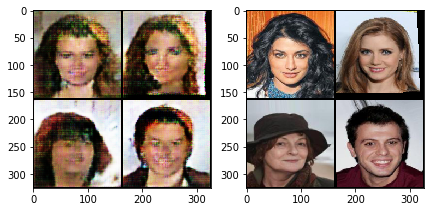

[0/1][1750/4221]	Disc/Dec Trains: 210.0/1725.0	Loss_D: 6.5385	Loss_Dec: 2.8586	Aux F1: 0.8616	Loss_Enc: 667.2841	D(x): 0.4492	D(G(z)): 0.2978
[0/1][2000/4221]	Disc/Dec Trains: 242.0/1969.0	Loss_D: 6.4965	Loss_Dec: 2.8670	Aux F1: 0.8625	Loss_Enc: 667.1063	D(x): 0.4703	D(G(z)): 0.3540
[0/1][2250/4221]	Disc/Dec Trains: 268.0/2209.0	Loss_D: 6.4645	Loss_Dec: 2.8693	Aux F1: 0.8633	Loss_Enc: 665.5937	D(x): 0.3888	D(G(z)): 0.3228
[0/1][2500/4221]	Disc/Dec Trains: 297.0/2454.0	Loss_D: 6.4280	Loss_Dec: 2.8741	Aux F1: 0.8640	Loss_Enc: 665.0733	D(x): 0.4208	D(G(z)): 0.3116
[0/1][2750/4221]	Disc/Dec Trains: 325.0/2698.0	Loss_D: 6.3927	Loss_Dec: 2.8779	Aux F1: 0.8647	Loss_Enc: 666.9828	D(x): 0.4227	D(G(z)): 0.3313
[0/1][3000/4221]	Disc/Dec Trains: 354.0/2942.0	Loss_D: 6.3608	Loss_Dec: 2.8823	Aux F1: 0.8653	Loss_Enc: 666.4994	D(x): 0.4072	D(G(z)): 0.3198


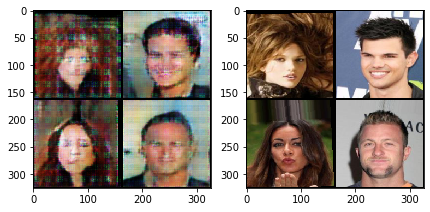

[0/1][3250/4221]	Disc/Dec Trains: 382.0/3183.0	Loss_D: 6.3311	Loss_Dec: 2.8836	Aux F1: 0.8659	Loss_Enc: 667.2110	D(x): 0.5185	D(G(z)): 0.2641
[0/1][3500/4221]	Disc/Dec Trains: 406.0/3428.0	Loss_D: 6.2994	Loss_Dec: 2.8859	Aux F1: 0.8665	Loss_Enc: 667.2416	D(x): 0.4022	D(G(z)): 0.3313
[0/1][3750/4221]	Disc/Dec Trains: 438.0/3673.0	Loss_D: 6.2696	Loss_Dec: 2.8940	Aux F1: 0.8670	Loss_Enc: 667.4200	D(x): 0.4992	D(G(z)): 0.3054
[0/1][4000/4221]	Disc/Dec Trains: 468.0/3917.0	Loss_D: 6.2395	Loss_Dec: 2.8977	Aux F1: 0.8675	Loss_Enc: 667.9624	D(x): 0.4405	D(G(z)): 0.2819


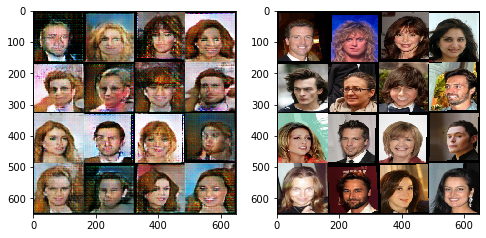

Copying file://./vaegan_resnet50_5a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/216.3 MiB.                                    
Copying file://./vaegan_resnet50_opt_disc_5a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/81.3 MiB.                     

In [0]:
train(net, n_epochs=1, train_loader=train_loader, margin=0.42, plot_images=1500)

[0/1][0/4221]	Disc/Dec Trains: 0.0/1.0	Loss_D: 6.0422	Loss_Dec: 2.7957	Aux F1: 0.8745	Loss_Enc: 714.0320	D(x): 0.3949	D(G(z)): 0.3632
[0/1][250/4221]	Disc/Dec Trains: 31.0/246.0	Loss_D: 5.6564	Loss_Dec: 3.0334	Aux F1: 0.8772	Loss_Enc: 704.4104	D(x): 0.4300	D(G(z)): 0.3284
[0/1][500/4221]	Disc/Dec Trains: 61.0/491.0	Loss_D: 5.6263	Loss_Dec: 3.0332	Aux F1: 0.8782	Loss_Enc: 705.3699	D(x): 0.4772	D(G(z)): 0.3237
[0/1][750/4221]	Disc/Dec Trains: 91.0/736.0	Loss_D: 5.6183	Loss_Dec: 3.0250	Aux F1: 0.8783	Loss_Enc: 701.0078	D(x): 0.4520	D(G(z)): 0.2953
[0/1][1000/4221]	Disc/Dec Trains: 120.0/985.0	Loss_D: 5.5975	Loss_Dec: 3.0338	Aux F1: 0.8784	Loss_Enc: 700.9253	D(x): 0.4950	D(G(z)): 0.2923
[0/1][1250/4221]	Disc/Dec Trains: 149.0/1230.0	Loss_D: 5.5829	Loss_Dec: 3.0376	Aux F1: 0.8785	Loss_Enc: 701.3403	D(x): 0.4473	D(G(z)): 0.3030
[0/1][1500/4221]	Disc/Dec Trains: 179.0/1477.0	Loss_D: 5.5672	Loss_Dec: 3.0406	Aux F1: 0.8786	Loss_Enc: 702.4465	D(x): 0.4125	D(G(z)): 0.3218
[0/1][1750/4221]	Disc/De

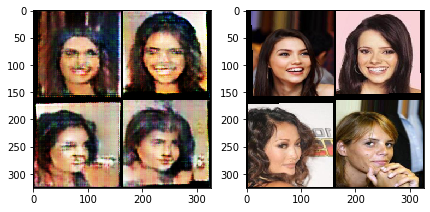

[0/1][2250/4221]	Disc/Dec Trains: 258.0/2215.0	Loss_D: 5.5233	Loss_Dec: 3.0367	Aux F1: 0.8792	Loss_Enc: 703.0063	D(x): 0.5248	D(G(z)): 0.2924
[0/1][2500/4221]	Disc/Dec Trains: 290.0/2463.0	Loss_D: 5.5074	Loss_Dec: 3.0420	Aux F1: 0.8794	Loss_Enc: 702.9982	D(x): 0.5067	D(G(z)): 0.3054
[0/1][2750/4221]	Disc/Dec Trains: 317.0/2712.0	Loss_D: 5.4927	Loss_Dec: 3.0454	Aux F1: 0.8797	Loss_Enc: 702.5138	D(x): 0.4989	D(G(z)): 0.3053
[0/1][3000/4221]	Disc/Dec Trains: 346.0/2959.0	Loss_D: 5.4811	Loss_Dec: 3.0475	Aux F1: 0.8798	Loss_Enc: 702.2737	D(x): 0.5189	D(G(z)): 0.2763
[0/1][3250/4221]	Disc/Dec Trains: 370.0/3206.0	Loss_D: 5.4715	Loss_Dec: 3.0453	Aux F1: 0.8800	Loss_Enc: 702.1973	D(x): 0.4175	D(G(z)): 0.3414
[0/1][3500/4221]	Disc/Dec Trains: 399.0/3454.0	Loss_D: 5.4581	Loss_Dec: 3.0444	Aux F1: 0.8802	Loss_Enc: 701.9107	D(x): 0.4759	D(G(z)): 0.3057
[0/1][3750/4221]	Disc/Dec Trains: 428.0/3703.0	Loss_D: 5.4458	Loss_Dec: 3.0461	Aux F1: 0.8804	Loss_Enc: 702.7302	D(x): 0.4096	D(G(z)): 0.3469
[0/1][

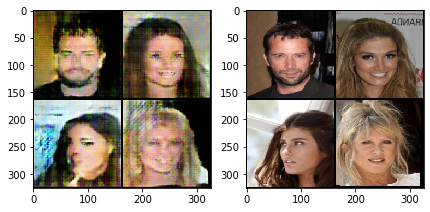

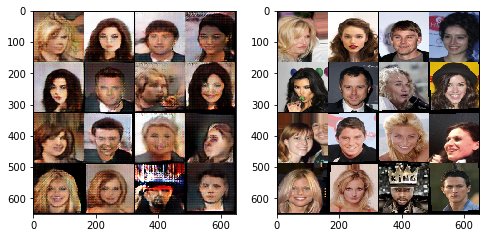

Copying file://./vaegan_resnet50_5a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/216.3 MiB.                                    
Copying file://./vaegan_resnet50_opt_disc_5a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/81.3 MiB.                     

In [0]:
train(net, n_epochs=1, train_loader=train_loader, margin=0.43, plot_images=2000)

[0/1][0/4221]	Disc/Dec Trains: 0.0/1.0	Loss_D: 4.9951	Loss_Dec: 3.0975	Aux F1: 0.8880	Loss_Enc: 723.7797	D(x): 0.4934	D(G(z)): 0.2766
[0/1][250/4221]	Disc/Dec Trains: 28.0/250.0	Loss_D: 5.0218	Loss_Dec: 3.1555	Aux F1: 0.8880	Loss_Enc: 739.7073	D(x): 0.4459	D(G(z)): 0.3331
[0/1][500/4221]	Disc/Dec Trains: 56.0/500.0	Loss_D: 5.0391	Loss_Dec: 3.1615	Aux F1: 0.8878	Loss_Enc: 738.3293	D(x): 0.4156	D(G(z)): 0.3573
[0/1][750/4221]	Disc/Dec Trains: 81.0/750.0	Loss_D: 5.0455	Loss_Dec: 3.1698	Aux F1: 0.8876	Loss_Enc: 739.6009	D(x): 0.6028	D(G(z)): 0.2788
[0/1][1000/4221]	Disc/Dec Trains: 110.0/1000.0	Loss_D: 5.0373	Loss_Dec: 3.1783	Aux F1: 0.8876	Loss_Enc: 740.3510	D(x): 0.4807	D(G(z)): 0.3244
[0/1][1250/4221]	Disc/Dec Trains: 141.0/1247.0	Loss_D: 5.0293	Loss_Dec: 3.1756	Aux F1: 0.8877	Loss_Enc: 739.5028	D(x): 0.5866	D(G(z)): 0.2492
[0/1][1500/4221]	Disc/Dec Trains: 166.0/1497.0	Loss_D: 5.0268	Loss_Dec: 3.1708	Aux F1: 0.8876	Loss_Enc: 738.4800	D(x): 0.5806	D(G(z)): 0.2666
[0/1][1750/4221]	Disc/D

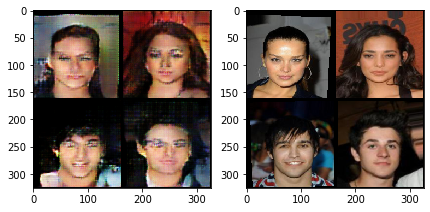

[0/1][2250/4221]	Disc/Dec Trains: 258.0/2247.0	Loss_D: 5.0001	Loss_Dec: 3.1910	Aux F1: 0.8880	Loss_Enc: 738.8842	D(x): 0.5249	D(G(z)): 0.3088
[0/1][2500/4221]	Disc/Dec Trains: 289.0/2497.0	Loss_D: 4.9940	Loss_Dec: 3.1964	Aux F1: 0.8881	Loss_Enc: 739.1610	D(x): 0.5226	D(G(z)): 0.2873
[0/1][2750/4221]	Disc/Dec Trains: 317.0/2747.0	Loss_D: 4.9897	Loss_Dec: 3.1945	Aux F1: 0.8883	Loss_Enc: 739.2775	D(x): 0.4814	D(G(z)): 0.3258
[0/1][3000/4221]	Disc/Dec Trains: 343.0/2997.0	Loss_D: 4.9872	Loss_Dec: 3.1960	Aux F1: 0.8884	Loss_Enc: 740.7403	D(x): 0.4976	D(G(z)): 0.3147
[0/1][3250/4221]	Disc/Dec Trains: 373.0/3247.0	Loss_D: 4.9837	Loss_Dec: 3.1963	Aux F1: 0.8885	Loss_Enc: 740.8877	D(x): 0.5529	D(G(z)): 0.2893
[0/1][3500/4221]	Disc/Dec Trains: 404.0/3496.0	Loss_D: 4.9794	Loss_Dec: 3.2007	Aux F1: 0.8886	Loss_Enc: 742.3776	D(x): 0.5167	D(G(z)): 0.2887
[0/1][3750/4221]	Disc/Dec Trains: 429.0/3744.0	Loss_D: 4.9780	Loss_Dec: 3.1983	Aux F1: 0.8887	Loss_Enc: 742.3770	D(x): 0.5015	D(G(z)): 0.3127
[0/1][

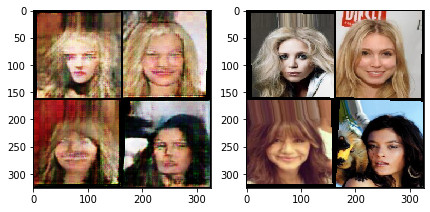

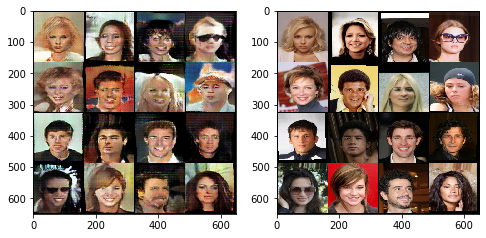

Copying file://./vaegan_resnet50_5a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/216.3 MiB.                                    
Copying file://./vaegan_resnet50_opt_disc_5a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/81.3 MiB.                     

In [0]:
train(net, n_epochs=1, train_loader=train_loader, margin=0.44, plot_images=2000)

[0/3][0/4221]	Disc/Dec Trains: 0.0/1.0	Loss_D: 4.5544	Loss_Dec: 3.2341	Aux F1: 0.8990	Loss_Enc: 758.8099	D(x): 0.5388	D(G(z)): 0.2886
[0/3][250/4221]	Disc/Dec Trains: 16.0/247.0	Loss_D: 5.0721	Loss_Dec: 2.9200	Aux F1: 0.8902	Loss_Enc: 751.5218	D(x): 0.4799	D(G(z)): 0.3154
[0/3][500/4221]	Disc/Dec Trains: 33.0/495.0	Loss_D: 5.0802	Loss_Dec: 2.8976	Aux F1: 0.8899	Loss_Enc: 755.5290	D(x): 0.4639	D(G(z)): 0.3102
[0/3][750/4221]	Disc/Dec Trains: 49.0/741.0	Loss_D: 5.0769	Loss_Dec: 2.8886	Aux F1: 0.8899	Loss_Enc: 749.2363	D(x): 0.5252	D(G(z)): 0.2949
[0/3][1000/4221]	Disc/Dec Trains: 65.0/989.0	Loss_D: 5.0638	Loss_Dec: 2.8860	Aux F1: 0.8903	Loss_Enc: 749.4830	D(x): 0.3896	D(G(z)): 0.3845
[0/3][1250/4221]	Disc/Dec Trains: 80.0/1238.0	Loss_D: 5.0586	Loss_Dec: 2.8752	Aux F1: 0.8904	Loss_Enc: 749.5009	D(x): 0.4205	D(G(z)): 0.3513
[0/3][1500/4221]	Disc/Dec Trains: 99.0/1486.0	Loss_D: 5.0589	Loss_Dec: 2.8734	Aux F1: 0.8902	Loss_Enc: 752.0134	D(x): 0.4882	D(G(z)): 0.3206
[0/3][1750/4221]	Disc/Dec T

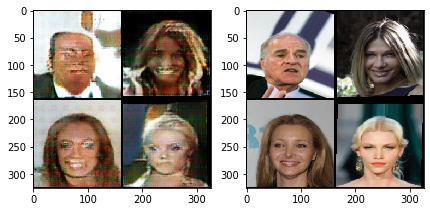

[0/3][2250/4221]	Disc/Dec Trains: 170.0/2227.0	Loss_D: 5.0418	Loss_Dec: 2.8781	Aux F1: 0.8902	Loss_Enc: 747.1582	D(x): 0.4606	D(G(z)): 0.3129
[0/3][2500/4221]	Disc/Dec Trains: 194.0/2473.0	Loss_D: 5.0353	Loss_Dec: 2.8801	Aux F1: 0.8903	Loss_Enc: 745.8170	D(x): 0.4659	D(G(z)): 0.2919
[0/3][2750/4221]	Disc/Dec Trains: 218.0/2721.0	Loss_D: 5.0302	Loss_Dec: 2.8836	Aux F1: 0.8903	Loss_Enc: 745.9422	D(x): 0.4517	D(G(z)): 0.2989
[0/3][3000/4221]	Disc/Dec Trains: 246.0/2966.0	Loss_D: 5.0250	Loss_Dec: 2.8853	Aux F1: 0.8904	Loss_Enc: 745.4982	D(x): 0.5354	D(G(z)): 0.2551
[0/3][3250/4221]	Disc/Dec Trains: 267.0/3216.0	Loss_D: 5.0203	Loss_Dec: 2.8852	Aux F1: 0.8905	Loss_Enc: 745.1305	D(x): 0.4556	D(G(z)): 0.3167
[0/3][3500/4221]	Disc/Dec Trains: 292.0/3464.0	Loss_D: 5.0152	Loss_Dec: 2.8854	Aux F1: 0.8907	Loss_Enc: 744.3416	D(x): 0.4707	D(G(z)): 0.3029
[0/3][3750/4221]	Disc/Dec Trains: 312.0/3712.0	Loss_D: 5.0125	Loss_Dec: 2.8865	Aux F1: 0.8907	Loss_Enc: 745.0464	D(x): 0.4483	D(G(z)): 0.3189
[0/3][

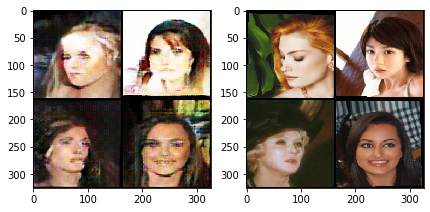

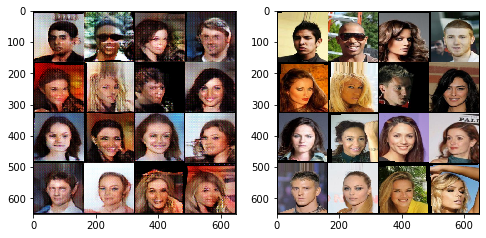

[1/3][0/4221]	Disc/Dec Trains: 0.0/1.0	Loss_D: 5.0043	Loss_Dec: 2.9037	Aux F1: 0.8885	Loss_Enc: 773.1664	D(x): 0.4878	D(G(z)): 0.2751
[1/3][250/4221]	Disc/Dec Trains: 20.0/249.0	Loss_D: 4.9601	Loss_Dec: 2.8540	Aux F1: 0.8926	Loss_Enc: 748.1491	D(x): 0.4969	D(G(z)): 0.2665
[1/3][500/4221]	Disc/Dec Trains: 45.0/499.0	Loss_D: 4.9385	Loss_Dec: 2.8863	Aux F1: 0.8926	Loss_Enc: 749.8227	D(x): 0.5069	D(G(z)): 0.3426
Interrupting... Saving model...
Copying file://./vaegan_resnet50_5a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
c

In [0]:
train(net, n_epochs=3, train_loader=train_loader, margin=0.40, plot_images=2000)

[0/1][0/4221]	Disc/Dec Trains: 0.0/1.0	Loss_D: 4.7851	Loss_Dec: 3.0746	Aux F1: 0.9016	Loss_Enc: 771.1399	D(x): 0.4595	D(G(z)): 0.3306
[0/1][250/4221]	Disc/Dec Trains: 22.0/251.0	Loss_D: 4.5904	Loss_Dec: 3.2591	Aux F1: 0.8984	Loss_Enc: 755.3269	D(x): 0.4877	D(G(z)): 0.3289
[0/1][500/4221]	Disc/Dec Trains: 43.0/501.0	Loss_D: 4.5880	Loss_Dec: 3.2685	Aux F1: 0.8983	Loss_Enc: 757.5789	D(x): 0.5336	D(G(z)): 0.2803
[0/1][750/4221]	Disc/Dec Trains: 62.0/751.0	Loss_D: 4.6062	Loss_Dec: 3.2654	Aux F1: 0.8980	Loss_Enc: 757.0932	D(x): 0.5525	D(G(z)): 0.2806
[0/1][1000/4221]	Disc/Dec Trains: 86.0/1001.0	Loss_D: 4.6017	Loss_Dec: 3.2817	Aux F1: 0.8979	Loss_Enc: 757.2164	D(x): 0.5378	D(G(z)): 0.2644
[0/1][1250/4221]	Disc/Dec Trains: 110.0/1251.0	Loss_D: 4.5964	Loss_Dec: 3.2942	Aux F1: 0.8979	Loss_Enc: 757.2432	D(x): 0.5573	D(G(z)): 0.2719
[0/1][1500/4221]	Disc/Dec Trains: 131.0/1501.0	Loss_D: 4.5932	Loss_Dec: 3.2956	Aux F1: 0.8980	Loss_Enc: 757.4675	D(x): 0.5162	D(G(z)): 0.3292
[0/1][1750/4221]	Disc/De

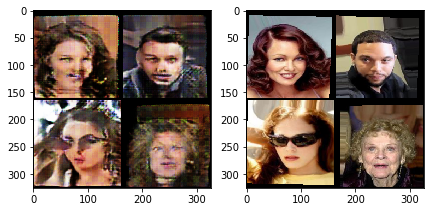

[0/1][2250/4221]	Disc/Dec Trains: 197.0/2251.0	Loss_D: 4.5901	Loss_Dec: 3.3000	Aux F1: 0.8979	Loss_Enc: 757.8944	D(x): 0.5607	D(G(z)): 0.2426
[0/1][2500/4221]	Disc/Dec Trains: 222.0/2501.0	Loss_D: 4.5869	Loss_Dec: 3.3063	Aux F1: 0.8979	Loss_Enc: 758.6976	D(x): 0.6016	D(G(z)): 0.2306
[0/1][2750/4221]	Disc/Dec Trains: 247.0/2751.0	Loss_D: 4.5831	Loss_Dec: 3.3107	Aux F1: 0.8979	Loss_Enc: 758.8802	D(x): 0.4816	D(G(z)): 0.2724
[0/1][3000/4221]	Disc/Dec Trains: 273.0/3001.0	Loss_D: 4.5827	Loss_Dec: 3.3075	Aux F1: 0.8980	Loss_Enc: 757.9835	D(x): 0.5914	D(G(z)): 0.2269
[0/1][3250/4221]	Disc/Dec Trains: 298.0/3251.0	Loss_D: 4.5832	Loss_Dec: 3.3096	Aux F1: 0.8980	Loss_Enc: 757.6215	D(x): 0.6063	D(G(z)): 0.2534
[0/1][3500/4221]	Disc/Dec Trains: 329.0/3501.0	Loss_D: 4.5817	Loss_Dec: 3.3088	Aux F1: 0.8980	Loss_Enc: 756.3317	D(x): 0.5477	D(G(z)): 0.2797
[0/1][3750/4221]	Disc/Dec Trains: 356.0/3751.0	Loss_D: 4.5784	Loss_Dec: 3.3143	Aux F1: 0.8980	Loss_Enc: 756.2214	D(x): 0.5413	D(G(z)): 0.2747
[0/1][

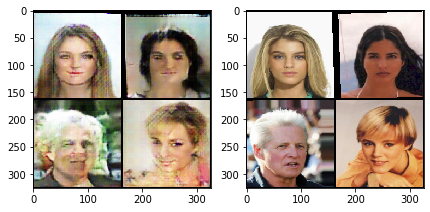

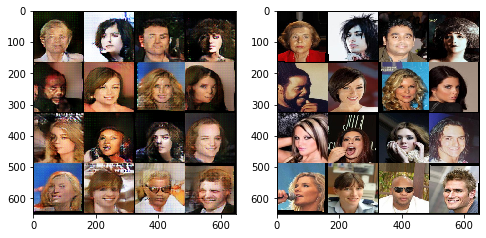

Copying file://./vaegan_resnet50_5a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/216.3 MiB.                                    
Copying file://./vaegan_resnet50_opt_disc_5a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/81.3 MiB.                     

In [0]:
train(net, n_epochs=1, train_loader=train_loader, margin=0.44, plot_images=2000)

[0/1][0/4221]	Disc/Dec Trains: 0.0/1.0	Loss_D: 4.8839	Loss_Dec: 3.2085	Aux F1: 0.8948	Loss_Enc: 1175.5735	D(x): 0.5171	D(G(z)): 0.2912
[0/1][250/4221]	Disc/Dec Trains: 20.0/251.0	Loss_D: 4.4721	Loss_Dec: 3.3219	Aux F1: 0.9010	Loss_Enc: 1215.4489	D(x): 0.5651	D(G(z)): 0.2611
[0/1][500/4221]	Disc/Dec Trains: 38.0/501.0	Loss_D: 4.4948	Loss_Dec: 3.2551	Aux F1: 0.9012	Loss_Enc: 1200.3317	D(x): 0.5425	D(G(z)): 0.2279
[0/1][750/4221]	Disc/Dec Trains: 56.0/750.0	Loss_D: 4.4974	Loss_Dec: 3.2828	Aux F1: 0.9010	Loss_Enc: 1211.3341	D(x): 0.4536	D(G(z)): 0.3446
[0/1][1000/4221]	Disc/Dec Trains: 74.0/999.0	Loss_D: 4.5052	Loss_Dec: 3.2677	Aux F1: 0.9010	Loss_Enc: 1213.5881	D(x): 0.5643	D(G(z)): 0.2624
[0/1][1250/4221]	Disc/Dec Trains: 101.0/1249.0	Loss_D: 4.4890	Loss_Dec: 3.2713	Aux F1: 0.9011	Loss_Enc: 1206.4028	D(x): 0.6123	D(G(z)): 0.2181
[0/1][1500/4221]	Disc/Dec Trains: 124.0/1499.0	Loss_D: 4.4933	Loss_Dec: 3.2770	Aux F1: 0.9010	Loss_Enc: 1201.5689	D(x): 0.5542	D(G(z)): 0.2681
[0/1][1750/4221]	D

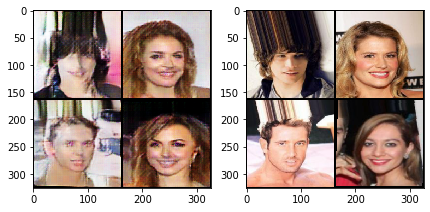

[0/1][2250/4221]	Disc/Dec Trains: 186.0/2249.0	Loss_D: 4.4773	Loss_Dec: 3.2884	Aux F1: 0.9012	Loss_Enc: 1201.2679	D(x): 0.5533	D(G(z)): 0.3047
[0/1][2500/4221]	Disc/Dec Trains: 201.0/2498.0	Loss_D: 4.4820	Loss_Dec: 3.2812	Aux F1: 0.9012	Loss_Enc: 1199.9740	D(x): 0.5340	D(G(z)): 0.2515
[0/1][2750/4221]	Disc/Dec Trains: 214.0/2748.0	Loss_D: 4.4841	Loss_Dec: 3.2725	Aux F1: 0.9012	Loss_Enc: 1200.1691	D(x): 0.5322	D(G(z)): 0.2590
[0/1][3000/4221]	Disc/Dec Trains: 230.0/2997.0	Loss_D: 4.4873	Loss_Dec: 3.2629	Aux F1: 0.9012	Loss_Enc: 1200.8812	D(x): 0.5989	D(G(z)): 0.2440
[0/1][3250/4221]	Disc/Dec Trains: 248.0/3247.0	Loss_D: 4.4870	Loss_Dec: 3.2601	Aux F1: 0.9012	Loss_Enc: 1200.6782	D(x): 0.5485	D(G(z)): 0.2596
[0/1][3500/4221]	Disc/Dec Trains: 269.0/3497.0	Loss_D: 4.4866	Loss_Dec: 3.2572	Aux F1: 0.9013	Loss_Enc: 1199.3256	D(x): 0.5392	D(G(z)): 0.2624
[0/1][3750/4221]	Disc/Dec Trains: 284.0/3747.0	Loss_D: 4.4845	Loss_Dec: 3.2582	Aux F1: 0.9013	Loss_Enc: 1201.1496	D(x): 0.5159	D(G(z)): 0.3199

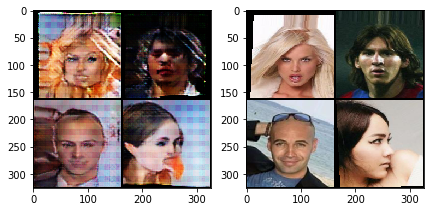

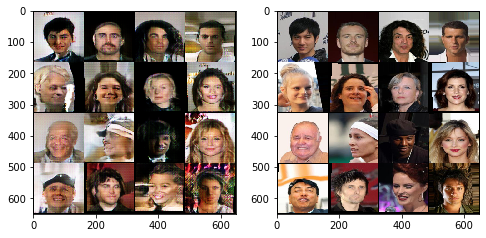

Copying file://./vaegan_resnet50_5a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/216.3 MiB.                                    
Copying file://./vaegan_resnet50_opt_disc_5a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/81.3 MiB.                     

In [0]:
  train(net, n_epochs=1, train_loader=train_loader, margin=0.44, plot_images=2000)

[0/2][0/4221]	Disc/Dec Trains: 1.0/1.0	Loss_D: 4.6778	Loss_Dec: 3.2821	Aux F1: 0.8979	Loss_Enc: 1239.5590	D(x): 0.5277	D(G(z)): 0.2434
[0/2][250/4221]	Disc/Dec Trains: 21.0/251.0	Loss_D: 4.3841	Loss_Dec: 3.2789	Aux F1: 0.9039	Loss_Enc: 1205.4751	D(x): 0.5029	D(G(z)): 0.2538
[0/2][500/4221]	Disc/Dec Trains: 48.0/501.0	Loss_D: 4.3775	Loss_Dec: 3.3322	Aux F1: 0.9032	Loss_Enc: 1218.1290	D(x): 0.5078	D(G(z)): 0.2556
[0/2][750/4221]	Disc/Dec Trains: 72.0/751.0	Loss_D: 4.3759	Loss_Dec: 3.3619	Aux F1: 0.9030	Loss_Enc: 1223.9856	D(x): 0.5916	D(G(z)): 0.2479
[0/2][1000/4221]	Disc/Dec Trains: 99.0/1001.0	Loss_D: 4.3674	Loss_Dec: 3.3827	Aux F1: 0.9029	Loss_Enc: 1224.4427	D(x): 0.5732	D(G(z)): 0.2564
[0/2][1250/4221]	Disc/Dec Trains: 117.0/1251.0	Loss_D: 4.3677	Loss_Dec: 3.3775	Aux F1: 0.9030	Loss_Enc: 1221.8184	D(x): 0.5697	D(G(z)): 0.2587
[0/2][1500/4221]	Disc/Dec Trains: 143.0/1501.0	Loss_D: 4.3668	Loss_Dec: 3.3820	Aux F1: 0.9031	Loss_Enc: 1221.2805	D(x): 0.5788	D(G(z)): 0.2385
[0/2][1750/4221]	

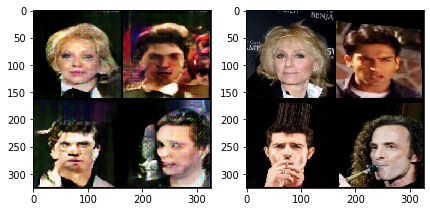

[0/2][2250/4221]	Disc/Dec Trains: 201.0/2251.0	Loss_D: 4.3673	Loss_Dec: 3.3963	Aux F1: 0.9029	Loss_Enc: 1230.2290	D(x): 0.5890	D(G(z)): 0.2352
[0/2][2500/4221]	Disc/Dec Trains: 221.0/2500.0	Loss_D: 4.3678	Loss_Dec: 3.3965	Aux F1: 0.9030	Loss_Enc: 1230.6700	D(x): 0.5618	D(G(z)): 0.2315
[0/2][2750/4221]	Disc/Dec Trains: 249.0/2750.0	Loss_D: 4.3647	Loss_Dec: 3.3958	Aux F1: 0.9030	Loss_Enc: 1230.3324	D(x): 0.6542	D(G(z)): 0.1996
[0/2][3000/4221]	Disc/Dec Trains: 282.0/3000.0	Loss_D: 4.3614	Loss_Dec: 3.4000	Aux F1: 0.9031	Loss_Enc: 1229.5567	D(x): 0.6235	D(G(z)): 0.2025
[0/2][3250/4221]	Disc/Dec Trains: 309.0/3250.0	Loss_D: 4.3599	Loss_Dec: 3.4111	Aux F1: 0.9031	Loss_Enc: 1230.5094	D(x): 0.5871	D(G(z)): 0.2561
[0/2][3500/4221]	Disc/Dec Trains: 345.0/3500.0	Loss_D: 4.3558	Loss_Dec: 3.4206	Aux F1: 0.9031	Loss_Enc: 1231.5890	D(x): 0.6106	D(G(z)): 0.2092
[0/2][3750/4221]	Disc/Dec Trains: 364.0/3750.0	Loss_D: 4.3541	Loss_Dec: 3.4242	Aux F1: 0.9031	Loss_Enc: 1232.0320	D(x): 0.6195	D(G(z)): 0.2320

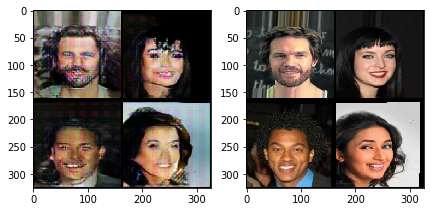

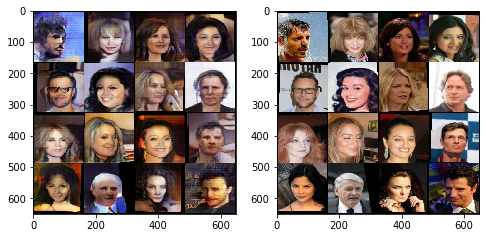

[1/2][0/4221]	Disc/Dec Trains: 1.0/1.0	Loss_D: 4.3830	Loss_Dec: 3.2561	Aux F1: 0.8979	Loss_Enc: 1190.4008	D(x): 0.5585	D(G(z)): 0.2546
[1/2][250/4221]	Disc/Dec Trains: 19.0/251.0	Loss_D: 4.3361	Loss_Dec: 3.4743	Aux F1: 0.9037	Loss_Enc: 1216.5204	D(x): 0.5390	D(G(z)): 0.2819
[1/2][500/4221]	Disc/Dec Trains: 34.0/501.0	Loss_D: 4.3274	Loss_Dec: 3.4550	Aux F1: 0.9041	Loss_Enc: 1222.0563	D(x): 0.5362	D(G(z)): 0.3018
[1/2][750/4221]	Disc/Dec Trains: 52.0/750.0	Loss_D: 4.3228	Loss_Dec: 3.4652	Aux F1: 0.9041	Loss_Enc: 1232.5648	D(x): 0.5678	D(G(z)): 0.2567
[1/2][1000/4221]	Disc/Dec Trains: 72.0/1000.0	Loss_D: 4.3170	Loss_Dec: 3.4755	Aux F1: 0.9039	Loss_Enc: 1237.6116	D(x): 0.5635	D(G(z)): 0.2741
[1/2][1250/4221]	Disc/Dec Trains: 89.0/1250.0	Loss_D: 4.3244	Loss_Dec: 3.4765	Aux F1: 0.9039	Loss_Enc: 1239.0354	D(x): 0.5934	D(G(z)): 0.2682
[1/2][1500/4221]	Disc/Dec Trains: 104.0/1500.0	Loss_D: 4.3274	Loss_Dec: 3.4667	Aux F1: 0.9040	Loss_Enc: 1235.2481	D(x): 0.4762	D(G(z)): 0.3343
[1/2][1750/4221]	D

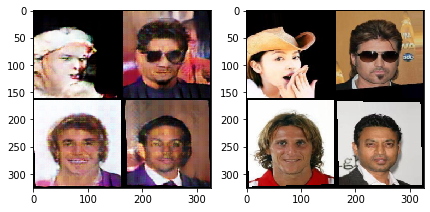

[1/2][2250/4221]	Disc/Dec Trains: 147.0/2250.0	Loss_D: 4.3446	Loss_Dec: 3.4278	Aux F1: 0.9039	Loss_Enc: 1230.7449	D(x): 0.5098	D(G(z)): 0.2644
[1/2][2500/4221]	Disc/Dec Trains: 160.0/2500.0	Loss_D: 4.3470	Loss_Dec: 3.4222	Aux F1: 0.9039	Loss_Enc: 1231.4188	D(x): 0.5689	D(G(z)): 0.2228
[1/2][2750/4221]	Disc/Dec Trains: 168.0/2750.0	Loss_D: 4.3498	Loss_Dec: 3.4137	Aux F1: 0.9039	Loss_Enc: 1231.8253	D(x): 0.5669	D(G(z)): 0.2434
[1/2][3000/4221]	Disc/Dec Trains: 178.0/3000.0	Loss_D: 4.3551	Loss_Dec: 3.4010	Aux F1: 0.9039	Loss_Enc: 1232.1956	D(x): 0.5635	D(G(z)): 0.2704
[1/2][3250/4221]	Disc/Dec Trains: 191.0/3250.0	Loss_D: 4.3547	Loss_Dec: 3.3924	Aux F1: 0.9039	Loss_Enc: 1230.1580	D(x): 0.5332	D(G(z)): 0.2852
[1/2][3500/4221]	Disc/Dec Trains: 203.0/3500.0	Loss_D: 4.3568	Loss_Dec: 3.3855	Aux F1: 0.9040	Loss_Enc: 1227.8787	D(x): 0.4914	D(G(z)): 0.2810
[1/2][3750/4221]	Disc/Dec Trains: 212.0/3750.0	Loss_D: 4.3599	Loss_Dec: 3.3802	Aux F1: 0.9039	Loss_Enc: 1227.8677	D(x): 0.5786	D(G(z)): 0.2329

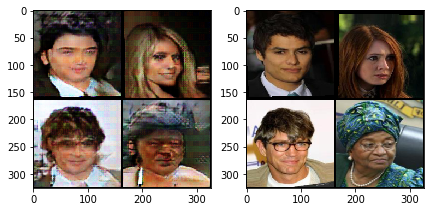

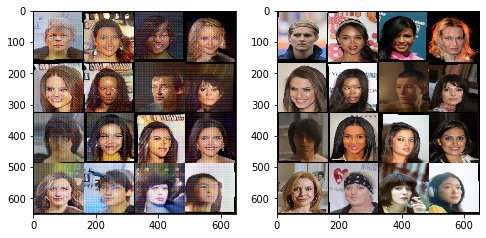

Copying file://./vaegan_resnet50_5a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

|
Operation completed over 1 objects/216.3 MiB.                                    
Copying file://./vaegan_resnet50_opt_disc_5a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/81.3 MiB.                     

In [0]:
train(net, n_epochs=2, train_loader=train_loader, margin=0.45, plot_images=2000)

[0/2][0/4221]	Disc/Dec Trains: 0.0/1.0	Loss_D: 4.1447	Loss_Dec: 3.5052	Aux F1: 0.8995	Loss_Enc: 1329.6501	D(x): 0.6124	D(G(z)): 0.2034
[0/2][250/4221]	Disc/Dec Trains: 18.0/251.0	Loss_D: 4.1551	Loss_Dec: 3.4549	Aux F1: 0.9073	Loss_Enc: 1332.8375	D(x): 0.5509	D(G(z)): 0.2183
[0/2][500/4221]	Disc/Dec Trains: 29.0/501.0	Loss_D: 4.1566	Loss_Dec: 3.4795	Aux F1: 0.9074	Loss_Enc: 1338.1764	D(x): 0.5402	D(G(z)): 0.2677
[0/2][750/4221]	Disc/Dec Trains: 38.0/751.0	Loss_D: 4.1900	Loss_Dec: 3.4662	Aux F1: 0.9071	Loss_Enc: 1335.5873	D(x): 0.6104	D(G(z)): 0.2260
[0/2][1000/4221]	Disc/Dec Trains: 48.0/1001.0	Loss_D: 4.2293	Loss_Dec: 3.4487	Aux F1: 0.9066	Loss_Enc: 1336.3832	D(x): 0.5454	D(G(z)): 0.2523
[0/2][1250/4221]	Disc/Dec Trains: 62.0/1251.0	Loss_D: 4.2411	Loss_Dec: 3.4356	Aux F1: 0.9066	Loss_Enc: 1336.4943	D(x): 0.6352	D(G(z)): 0.2183
[0/2][1500/4221]	Disc/Dec Trains: 76.0/1500.0	Loss_D: 4.2472	Loss_Dec: 3.4321	Aux F1: 0.9066	Loss_Enc: 1336.8714	D(x): 0.6197	D(G(z)): 0.2071
[0/2][1750/4221]	Di

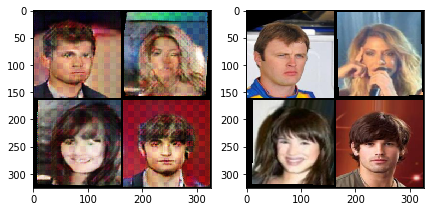

[0/2][2250/4221]	Disc/Dec Trains: 106.0/2250.0	Loss_D: 4.2420	Loss_Dec: 3.4394	Aux F1: 0.9065	Loss_Enc: 1339.9624	D(x): 0.5766	D(G(z)): 0.2006
[0/2][2500/4221]	Disc/Dec Trains: 120.0/2500.0	Loss_D: 4.2367	Loss_Dec: 3.4435	Aux F1: 0.9065	Loss_Enc: 1339.9981	D(x): 0.5953	D(G(z)): 0.2344
[0/2][2750/4221]	Disc/Dec Trains: 131.0/2750.0	Loss_D: 4.2340	Loss_Dec: 3.4476	Aux F1: 0.9065	Loss_Enc: 1340.8907	D(x): 0.6364	D(G(z)): 0.1864
[0/2][3000/4221]	Disc/Dec Trains: 143.0/2999.0	Loss_D: 4.2328	Loss_Dec: 3.4492	Aux F1: 0.9065	Loss_Enc: 1342.2226	D(x): 0.5541	D(G(z)): 0.1895
[0/2][3250/4221]	Disc/Dec Trains: 155.0/3249.0	Loss_D: 4.2261	Loss_Dec: 3.4560	Aux F1: 0.9065	Loss_Enc: 1344.0977	D(x): 0.5927	D(G(z)): 0.1774
[0/2][3500/4221]	Disc/Dec Trains: 166.0/3499.0	Loss_D: 4.2246	Loss_Dec: 3.4615	Aux F1: 0.9065	Loss_Enc: 1346.2092	D(x): 0.5864	D(G(z)): 0.2577
[0/2][3750/4221]	Disc/Dec Trains: 172.0/3749.0	Loss_D: 4.2295	Loss_Dec: 3.4599	Aux F1: 0.9065	Loss_Enc: 1346.8015	D(x): 0.5882	D(G(z)): 0.2182

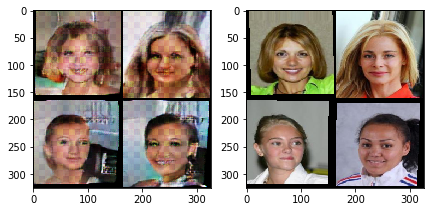

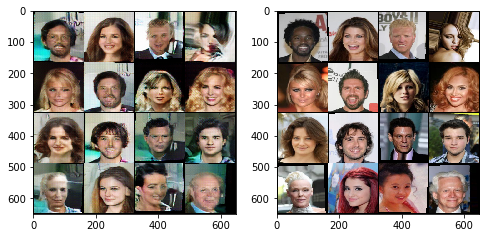

[1/2][0/4221]	Disc/Dec Trains: 1.0/1.0	Loss_D: 4.3889	Loss_Dec: 3.4085	Aux F1: 0.8995	Loss_Enc: 1369.8403	D(x): 0.5642	D(G(z)): 0.2093
[1/2][250/4221]	Disc/Dec Trains: 26.0/251.0	Loss_D: 4.2887	Loss_Dec: 3.6094	Aux F1: 0.9031	Loss_Enc: 1427.2488	D(x): 0.5936	D(G(z)): 0.2150
[1/2][500/4221]	Disc/Dec Trains: 63.0/500.0	Loss_D: 4.2610	Loss_Dec: 3.6418	Aux F1: 0.9030	Loss_Enc: 1402.0224	D(x): 0.6395	D(G(z)): 0.2087
[1/2][750/4221]	Disc/Dec Trains: 96.0/750.0	Loss_D: 4.2646	Loss_Dec: 3.6406	Aux F1: 0.9032	Loss_Enc: 1387.7751	D(x): 0.6406	D(G(z)): 0.2123
[1/2][1000/4221]	Disc/Dec Trains: 124.0/1000.0	Loss_D: 4.2766	Loss_Dec: 3.6566	Aux F1: 0.9029	Loss_Enc: 1390.5332	D(x): 0.5431	D(G(z)): 0.2570
[1/2][1250/4221]	Disc/Dec Trains: 158.0/1249.0	Loss_D: 4.2796	Loss_Dec: 3.6555	Aux F1: 0.9028	Loss_Enc: 1380.6412	D(x): 0.5459	D(G(z)): 0.2372
[1/2][1500/4221]	Disc/Dec Trains: 182.0/1498.0	Loss_D: 4.2854	Loss_Dec: 3.6471	Aux F1: 0.9028	Loss_Enc: 1377.5931	D(x): 0.5947	D(G(z)): 0.1918
[1/2][1750/4221]

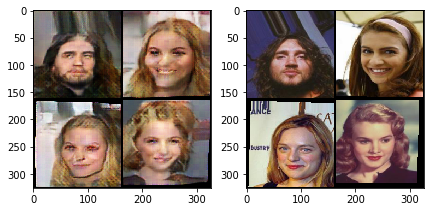

[1/2][2250/4221]	Disc/Dec Trains: 285.0/2248.0	Loss_D: 4.2771	Loss_Dec: 3.6374	Aux F1: 0.9029	Loss_Enc: 1350.5361	D(x): 0.6835	D(G(z)): 0.2016
[1/2][2500/4221]	Disc/Dec Trains: 311.0/2498.0	Loss_D: 4.2767	Loss_Dec: 3.6419	Aux F1: 0.9029	Loss_Enc: 1347.4718	D(x): 0.5884	D(G(z)): 0.2337
[1/2][2750/4221]	Disc/Dec Trains: 341.0/2747.0	Loss_D: 4.2764	Loss_Dec: 3.6404	Aux F1: 0.9030	Loss_Enc: 1344.1293	D(x): 0.5938	D(G(z)): 0.2297
[1/2][3000/4221]	Disc/Dec Trains: 374.0/2997.0	Loss_D: 4.2771	Loss_Dec: 3.6385	Aux F1: 0.9029	Loss_Enc: 1339.0907	D(x): 0.5892	D(G(z)): 0.2014
[1/2][3250/4221]	Disc/Dec Trains: 412.0/3247.0	Loss_D: 4.2745	Loss_Dec: 3.6411	Aux F1: 0.9030	Loss_Enc: 1334.1062	D(x): 0.6264	D(G(z)): 0.2749
[1/2][3500/4221]	Disc/Dec Trains: 443.0/3497.0	Loss_D: 4.2736	Loss_Dec: 3.6435	Aux F1: 0.9030	Loss_Enc: 1331.1002	D(x): 0.5421	D(G(z)): 0.2347
[1/2][3750/4221]	Disc/Dec Trains: 471.0/3747.0	Loss_D: 4.2748	Loss_Dec: 3.6397	Aux F1: 0.9031	Loss_Enc: 1328.2388	D(x): 0.5723	D(G(z)): 0.2354

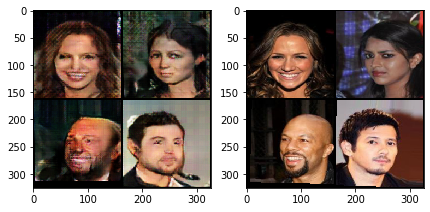

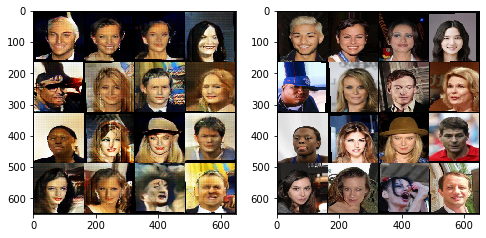

Copying file://./vaegan_resnet50_5a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

-
Operation completed over 1 objects/216.3 MiB.                                    
Copying file://./vaegan_resnet50_opt_disc_5a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/81.3 MiB.                     

In [0]:
train(net, n_epochs=2, train_loader=train_loader, margin=0.47, plot_images=2000)

[0/2][0/6147]	Disc/Dec Trains: 1.0/1.0	Loss_D: 3.4418	Loss_Dec: 2.9979	Aux F1: 0.9078	Loss_Enc: 1418.9667	D(x): 0.5099	D(G(z)): 0.3028
[0/2][250/6147]	Disc/Dec Trains: 13.0/251.0	Loss_D: 3.2723	Loss_Dec: 3.4038	Aux F1: 0.9059	Loss_Enc: 1376.8720	D(x): 0.5668	D(G(z)): 0.2625
[0/2][500/6147]	Disc/Dec Trains: 26.0/501.0	Loss_D: 3.2598	Loss_Dec: 3.4242	Aux F1: 0.9066	Loss_Enc: 1358.5853	D(x): 0.5391	D(G(z)): 0.2723
[0/2][750/6147]	Disc/Dec Trains: 35.0/751.0	Loss_D: 3.2647	Loss_Dec: 3.4204	Aux F1: 0.9065	Loss_Enc: 1354.9104	D(x): 0.5857	D(G(z)): 0.2753
[0/2][1000/6147]	Disc/Dec Trains: 45.0/1001.0	Loss_D: 3.2630	Loss_Dec: 3.4197	Aux F1: 0.9067	Loss_Enc: 1352.1661	D(x): 0.5387	D(G(z)): 0.3277
[0/2][1250/6147]	Disc/Dec Trains: 60.0/1251.0	Loss_D: 3.2611	Loss_Dec: 3.4250	Aux F1: 0.9066	Loss_Enc: 1349.1870	D(x): 0.5936	D(G(z)): 0.2214
[0/2][1500/6147]	Disc/Dec Trains: 68.0/1501.0	Loss_D: 3.2563	Loss_Dec: 3.4310	Aux F1: 0.9066	Loss_Enc: 1349.3295	D(x): 0.5854	D(G(z)): 0.2491
[0/2][1750/6147]	Di

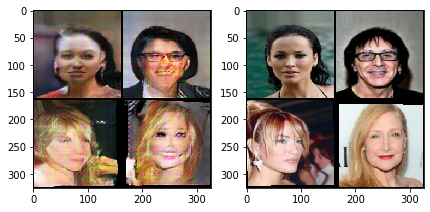

[0/2][2250/6147]	Disc/Dec Trains: 106.0/2251.0	Loss_D: 3.2579	Loss_Dec: 3.4382	Aux F1: 0.9066	Loss_Enc: 1344.2799	D(x): 0.5876	D(G(z)): 0.2586
[0/2][2500/6147]	Disc/Dec Trains: 118.0/2501.0	Loss_D: 3.2616	Loss_Dec: 3.4413	Aux F1: 0.9065	Loss_Enc: 1342.2680	D(x): 0.5573	D(G(z)): 0.2804
[0/2][2750/6147]	Disc/Dec Trains: 131.0/2751.0	Loss_D: 3.2625	Loss_Dec: 3.4479	Aux F1: 0.9064	Loss_Enc: 1340.1595	D(x): 0.5707	D(G(z)): 0.2565
[0/2][3000/6147]	Disc/Dec Trains: 139.0/3001.0	Loss_D: 3.2682	Loss_Dec: 3.4516	Aux F1: 0.9063	Loss_Enc: 1339.6611	D(x): 0.6241	D(G(z)): 0.2232
[0/2][3250/6147]	Disc/Dec Trains: 146.0/3251.0	Loss_D: 3.2742	Loss_Dec: 3.4475	Aux F1: 0.9063	Loss_Enc: 1339.7858	D(x): 0.5239	D(G(z)): 0.3057
[0/2][3500/6147]	Disc/Dec Trains: 155.0/3501.0	Loss_D: 3.2804	Loss_Dec: 3.4440	Aux F1: 0.9063	Loss_Enc: 1339.6525	D(x): 0.5676	D(G(z)): 0.2571
[0/2][3750/6147]	Disc/Dec Trains: 169.0/3751.0	Loss_D: 3.2787	Loss_Dec: 3.4476	Aux F1: 0.9063	Loss_Enc: 1341.0030	D(x): 0.6661	D(G(z)): 0.1684

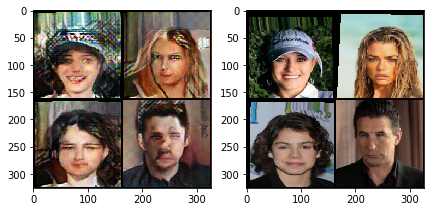

[0/2][4250/6147]	Disc/Dec Trains: 196.0/4251.0	Loss_D: 3.2751	Loss_Dec: 3.4553	Aux F1: 0.9063	Loss_Enc: 1339.7231	D(x): 0.6024	D(G(z)): 0.2400
[0/2][4500/6147]	Disc/Dec Trains: 206.0/4501.0	Loss_D: 3.2733	Loss_Dec: 3.4589	Aux F1: 0.9063	Loss_Enc: 1339.7250	D(x): 0.5470	D(G(z)): 0.2370
[0/2][4750/6147]	Disc/Dec Trains: 217.0/4751.0	Loss_D: 3.2737	Loss_Dec: 3.4604	Aux F1: 0.9063	Loss_Enc: 1339.7746	D(x): 0.6018	D(G(z)): 0.2529
[0/2][5000/6147]	Disc/Dec Trains: 229.0/5001.0	Loss_D: 3.2733	Loss_Dec: 3.4627	Aux F1: 0.9063	Loss_Enc: 1340.1945	D(x): 0.5576	D(G(z)): 0.2508
[0/2][5250/6147]	Disc/Dec Trains: 247.0/5251.0	Loss_D: 3.2689	Loss_Dec: 3.4711	Aux F1: 0.9063	Loss_Enc: 1341.2884	D(x): 0.5790	D(G(z)): 0.2636
[0/2][5500/6147]	Disc/Dec Trains: 257.0/5501.0	Loss_D: 3.2693	Loss_Dec: 3.4741	Aux F1: 0.9063	Loss_Enc: 1342.4276	D(x): 0.6474	D(G(z)): 0.1927
[0/2][5750/6147]	Disc/Dec Trains: 268.0/5751.0	Loss_D: 3.2687	Loss_Dec: 3.4771	Aux F1: 0.9063	Loss_Enc: 1341.9167	D(x): 0.5779	D(G(z)): 0.2328

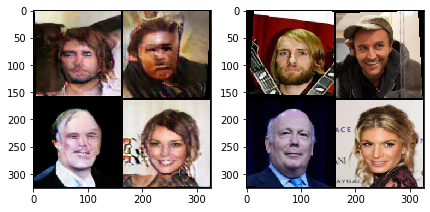

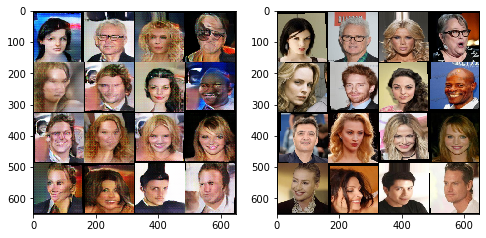

[1/2][0/6147]	Disc/Dec Trains: 0.0/1.0	Loss_D: 3.1943	Loss_Dec: 3.4600	Aux F1: 0.9136	Loss_Enc: 1347.7981	D(x): 0.5841	D(G(z)): 0.2638
[1/2][250/6147]	Disc/Dec Trains: 10.0/251.0	Loss_D: 3.2621	Loss_Dec: 3.4970	Aux F1: 0.9072	Loss_Enc: 1340.8375	D(x): 0.6556	D(G(z)): 0.2487
[1/2][500/6147]	Disc/Dec Trains: 19.0/501.0	Loss_D: 3.2571	Loss_Dec: 3.4886	Aux F1: 0.9072	Loss_Enc: 1340.4243	D(x): 0.6271	D(G(z)): 0.2242
[1/2][750/6147]	Disc/Dec Trains: 29.0/751.0	Loss_D: 3.2351	Loss_Dec: 3.4985	Aux F1: 0.9075	Loss_Enc: 1331.3074	D(x): 0.5648	D(G(z)): 0.2648
[1/2][1000/6147]	Disc/Dec Trains: 36.0/1001.0	Loss_D: 3.2444	Loss_Dec: 3.5109	Aux F1: 0.9074	Loss_Enc: 1334.5323	D(x): 0.5926	D(G(z)): 0.2926
[1/2][1250/6147]	Disc/Dec Trains: 49.0/1251.0	Loss_D: 3.2474	Loss_Dec: 3.5071	Aux F1: 0.9074	Loss_Enc: 1336.5149	D(x): 0.5940	D(G(z)): 0.2595
[1/2][1500/6147]	Disc/Dec Trains: 57.0/1501.0	Loss_D: 3.2415	Loss_Dec: 3.5222	Aux F1: 0.9073	Loss_Enc: 1341.8876	D(x): 0.6110	D(G(z)): 0.2188
[1/2][1750/6147]	Di

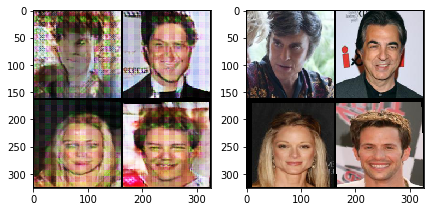

[1/2][2250/6147]	Disc/Dec Trains: 81.0/2251.0	Loss_D: 3.2564	Loss_Dec: 3.5155	Aux F1: 0.9075	Loss_Enc: 1347.4567	D(x): 0.6087	D(G(z)): 0.2428
[1/2][2500/6147]	Disc/Dec Trains: 88.0/2501.0	Loss_D: 3.2581	Loss_Dec: 3.5111	Aux F1: 0.9075	Loss_Enc: 1350.2777	D(x): 0.6094	D(G(z)): 0.2356
[1/2][2750/6147]	Disc/Dec Trains: 98.0/2751.0	Loss_D: 3.2644	Loss_Dec: 3.5016	Aux F1: 0.9074	Loss_Enc: 1352.6005	D(x): 0.5281	D(G(z)): 0.2639
[1/2][3000/6147]	Disc/Dec Trains: 105.0/3001.0	Loss_D: 3.2692	Loss_Dec: 3.4967	Aux F1: 0.9073	Loss_Enc: 1352.4582	D(x): 0.5544	D(G(z)): 0.2834
[1/2][3250/6147]	Disc/Dec Trains: 114.0/3251.0	Loss_D: 3.2724	Loss_Dec: 3.4944	Aux F1: 0.9073	Loss_Enc: 1352.2847	D(x): 0.5829	D(G(z)): 0.2178
[1/2][3500/6147]	Disc/Dec Trains: 120.0/3501.0	Loss_D: 3.2734	Loss_Dec: 3.4968	Aux F1: 0.9072	Loss_Enc: 1353.4346	D(x): 0.5834	D(G(z)): 0.2489
[1/2][3750/6147]	Disc/Dec Trains: 129.0/3751.0	Loss_D: 3.2723	Loss_Dec: 3.5002	Aux F1: 0.9072	Loss_Enc: 1355.3361	D(x): 0.5660	D(G(z)): 0.3139
[1

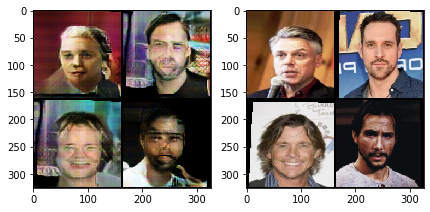

[1/2][4250/6147]	Disc/Dec Trains: 144.0/4251.0	Loss_D: 3.2739	Loss_Dec: 3.4960	Aux F1: 0.9072	Loss_Enc: 1357.4622	D(x): 0.5600	D(G(z)): 0.2368
[1/2][4500/6147]	Disc/Dec Trains: 152.0/4501.0	Loss_D: 3.2780	Loss_Dec: 3.4910	Aux F1: 0.9072	Loss_Enc: 1357.5906	D(x): 0.4989	D(G(z)): 0.3441
[1/2][4750/6147]	Disc/Dec Trains: 161.0/4751.0	Loss_D: 3.2784	Loss_Dec: 3.4894	Aux F1: 0.9072	Loss_Enc: 1357.7630	D(x): 0.5594	D(G(z)): 0.2574
[1/2][5000/6147]	Disc/Dec Trains: 172.0/5001.0	Loss_D: 3.2769	Loss_Dec: 3.4917	Aux F1: 0.9071	Loss_Enc: 1358.9761	D(x): 0.5872	D(G(z)): 0.2693
[1/2][5250/6147]	Disc/Dec Trains: 179.0/5251.0	Loss_D: 3.2758	Loss_Dec: 3.4940	Aux F1: 0.9071	Loss_Enc: 1359.8220	D(x): 0.5672	D(G(z)): 0.2375
[1/2][5500/6147]	Disc/Dec Trains: 194.0/5501.0	Loss_D: 3.2724	Loss_Dec: 3.4960	Aux F1: 0.9071	Loss_Enc: 1359.2264	D(x): 0.5900	D(G(z)): 0.2984
[1/2][5750/6147]	Disc/Dec Trains: 201.0/5751.0	Loss_D: 3.2719	Loss_Dec: 3.4962	Aux F1: 0.9071	Loss_Enc: 1359.5380	D(x): 0.5822	D(G(z)): 0.2619

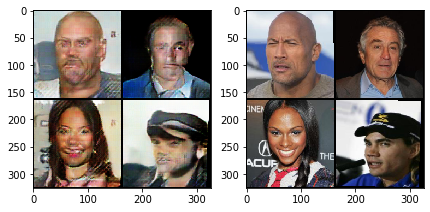

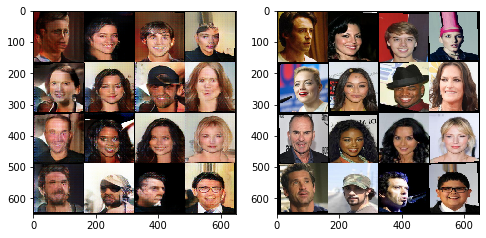

Copying file://./vaegan_resnet50_5a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

-
Operation completed over 1 objects/216.3 MiB.                                    
Copying file://./vaegan_resnet50_opt_disc_5a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 objects/81.3 MiB.                     

In [0]:
train(net, n_epochs=2, train_loader=train_loader, margin=0.475, plot_images=2000)

[0/2][0/6147]	Disc/Dec Trains: 0.0/1.0	Loss_D: 3.3645	Loss_Dec: 3.6882	Aux F1: 0.8993	Loss_Enc: 1411.4489	D(x): 0.6419	D(G(z)): 0.2223
[0/2][250/6147]	Disc/Dec Trains: 3.0/251.0	Loss_D: 3.2239	Loss_Dec: 3.5481	Aux F1: 0.9097	Loss_Enc: 1367.2413	D(x): 0.6068	D(G(z)): 0.2530
[0/2][500/6147]	Disc/Dec Trains: 9.0/501.0	Loss_D: 3.1902	Loss_Dec: 3.5569	Aux F1: 0.9100	Loss_Enc: 1382.1789	D(x): 0.6423	D(G(z)): 0.2160
[0/2][750/6147]	Disc/Dec Trains: 12.0/751.0	Loss_D: 3.1867	Loss_Dec: 3.5643	Aux F1: 0.9103	Loss_Enc: 1389.2932	D(x): 0.5188	D(G(z)): 0.2841
[0/2][1000/6147]	Disc/Dec Trains: 18.0/1001.0	Loss_D: 3.1903	Loss_Dec: 3.5595	Aux F1: 0.9105	Loss_Enc: 1394.7681	D(x): 0.6207	D(G(z)): 0.2231
[0/2][1250/6147]	Disc/Dec Trains: 21.0/1251.0	Loss_D: 3.1878	Loss_Dec: 3.5559	Aux F1: 0.9106	Loss_Enc: 1392.9383	D(x): 0.5466	D(G(z)): 0.2635
[0/2][1500/6147]	Disc/Dec Trains: 29.0/1501.0	Loss_D: 3.1933	Loss_Dec: 3.5452	Aux F1: 0.9106	Loss_Enc: 1391.7077	D(x): 0.5827	D(G(z)): 0.2437
[0/2][1750/6147]	Disc

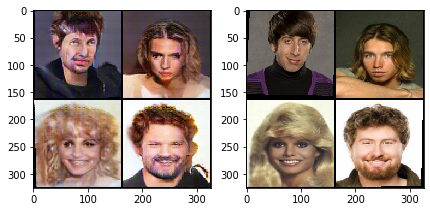

[0/2][2250/6147]	Disc/Dec Trains: 45.0/2251.0	Loss_D: 3.1918	Loss_Dec: 3.5508	Aux F1: 0.9105	Loss_Enc: 1397.2895	D(x): 0.5804	D(G(z)): 0.2369
[0/2][2500/6147]	Disc/Dec Trains: 52.0/2501.0	Loss_D: 3.1840	Loss_Dec: 3.5557	Aux F1: 0.9105	Loss_Enc: 1396.7715	D(x): 0.5841	D(G(z)): 0.2237
[0/2][2750/6147]	Disc/Dec Trains: 59.0/2751.0	Loss_D: 3.1791	Loss_Dec: 3.5618	Aux F1: 0.9105	Loss_Enc: 1397.6509	D(x): 0.5884	D(G(z)): 0.1896
[0/2][3000/6147]	Disc/Dec Trains: 64.0/3001.0	Loss_D: 3.1766	Loss_Dec: 3.5695	Aux F1: 0.9106	Loss_Enc: 1398.2110	D(x): 0.6208	D(G(z)): 0.2475
[0/2][3250/6147]	Disc/Dec Trains: 69.0/3251.0	Loss_D: 3.1755	Loss_Dec: 3.5751	Aux F1: 0.9105	Loss_Enc: 1399.0025	D(x): 0.6075	D(G(z)): 0.2048
[0/2][3500/6147]	Disc/Dec Trains: 72.0/3501.0	Loss_D: 3.1742	Loss_Dec: 3.5756	Aux F1: 0.9106	Loss_Enc: 1400.0009	D(x): 0.5198	D(G(z)): 0.2737
[0/2][3750/6147]	Disc/Dec Trains: 75.0/3751.0	Loss_D: 3.1786	Loss_Dec: 3.5701	Aux F1: 0.9106	Loss_Enc: 1400.2729	D(x): 0.5272	D(G(z)): 0.2798
[0/2][

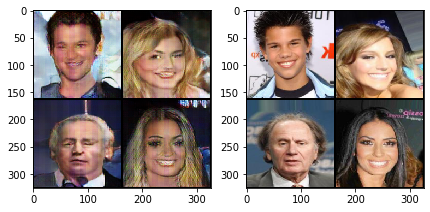

[0/2][4250/6147]	Disc/Dec Trains: 85.0/4251.0	Loss_D: 3.1802	Loss_Dec: 3.5679	Aux F1: 0.9106	Loss_Enc: 1401.2711	D(x): 0.6047	D(G(z)): 0.2264
[0/2][4500/6147]	Disc/Dec Trains: 93.0/4501.0	Loss_D: 3.1785	Loss_Dec: 3.5669	Aux F1: 0.9106	Loss_Enc: 1400.1421	D(x): 0.5805	D(G(z)): 0.2198
[0/2][4750/6147]	Disc/Dec Trains: 98.0/4751.0	Loss_D: 3.1763	Loss_Dec: 3.5668	Aux F1: 0.9106	Loss_Enc: 1397.9811	D(x): 0.5634	D(G(z)): 0.2718
[0/2][5000/6147]	Disc/Dec Trains: 109.0/5001.0	Loss_D: 3.1714	Loss_Dec: 3.5711	Aux F1: 0.9106	Loss_Enc: 1397.0323	D(x): 0.6230	D(G(z)): 0.2110
[0/2][5250/6147]	Disc/Dec Trains: 113.0/5251.0	Loss_D: 3.1686	Loss_Dec: 3.5742	Aux F1: 0.9106	Loss_Enc: 1395.7660	D(x): 0.6189	D(G(z)): 0.2258
[0/2][5500/6147]	Disc/Dec Trains: 119.0/5501.0	Loss_D: 3.1665	Loss_Dec: 3.5746	Aux F1: 0.9106	Loss_Enc: 1394.5574	D(x): 0.6282	D(G(z)): 0.2169
[0/2][5750/6147]	Disc/Dec Trains: 125.0/5751.0	Loss_D: 3.1652	Loss_Dec: 3.5740	Aux F1: 0.9107	Loss_Enc: 1393.7978	D(x): 0.6003	D(G(z)): 0.2155
[0

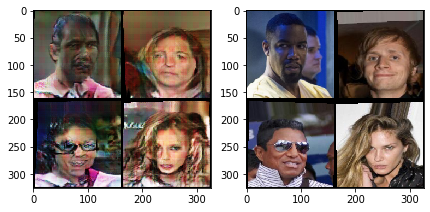

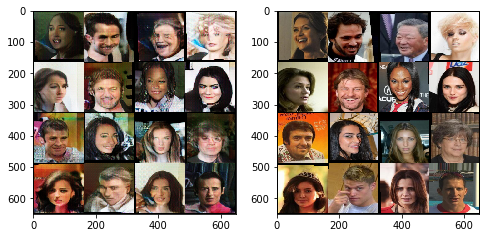

[1/2][0/6147]	Disc/Dec Trains: 0.0/1.0	Loss_D: 3.3171	Loss_Dec: 3.6706	Aux F1: 0.9176	Loss_Enc: 1360.6877	D(x): 0.5942	D(G(z)): 0.2492
[1/2][250/6147]	Disc/Dec Trains: 14.0/251.0	Loss_D: 3.1740	Loss_Dec: 3.6911	Aux F1: 0.9082	Loss_Enc: 1389.2752	D(x): 0.6705	D(G(z)): 0.2148
[1/2][500/6147]	Disc/Dec Trains: 23.0/501.0	Loss_D: 3.1486	Loss_Dec: 3.6648	Aux F1: 0.9089	Loss_Enc: 1383.2059	D(x): 0.6567	D(G(z)): 0.1988
[1/2][750/6147]	Disc/Dec Trains: 31.0/751.0	Loss_D: 3.1691	Loss_Dec: 3.6644	Aux F1: 0.9086	Loss_Enc: 1389.4378	D(x): 0.5712	D(G(z)): 0.2324
[1/2][1000/6147]	Disc/Dec Trains: 42.0/1001.0	Loss_D: 3.1644	Loss_Dec: 3.6766	Aux F1: 0.9084	Loss_Enc: 1399.9811	D(x): 0.6095	D(G(z)): 0.2059
[1/2][1250/6147]	Disc/Dec Trains: 52.0/1251.0	Loss_D: 3.1669	Loss_Dec: 3.6780	Aux F1: 0.9081	Loss_Enc: 1409.0175	D(x): 0.6189	D(G(z)): 0.2033
[1/2][1500/6147]	Disc/Dec Trains: 61.0/1501.0	Loss_D: 3.1719	Loss_Dec: 3.6708	Aux F1: 0.9081	Loss_Enc: 1419.5076	D(x): 0.5634	D(G(z)): 0.2359
[1/2][1750/6147]	Di

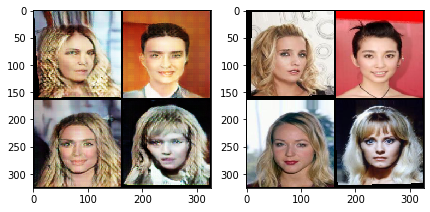

[1/2][2250/6147]	Disc/Dec Trains: 93.0/2251.0	Loss_D: 3.1614	Loss_Dec: 3.6839	Aux F1: 0.9082	Loss_Enc: 1425.7116	D(x): 0.5666	D(G(z)): 0.2786
[1/2][2500/6147]	Disc/Dec Trains: 103.0/2501.0	Loss_D: 3.1615	Loss_Dec: 3.6828	Aux F1: 0.9082	Loss_Enc: 1424.8208	D(x): 0.6449	D(G(z)): 0.2503
[1/2][2750/6147]	Disc/Dec Trains: 115.0/2751.0	Loss_D: 3.1575	Loss_Dec: 3.6877	Aux F1: 0.9082	Loss_Enc: 1424.1559	D(x): 0.5936	D(G(z)): 0.2538
[1/2][3000/6147]	Disc/Dec Trains: 127.0/3001.0	Loss_D: 3.1531	Loss_Dec: 3.6927	Aux F1: 0.9082	Loss_Enc: 1422.3848	D(x): 0.6349	D(G(z)): 0.1814
[1/2][3250/6147]	Disc/Dec Trains: 141.0/3251.0	Loss_D: 3.1454	Loss_Dec: 3.7051	Aux F1: 0.9083	Loss_Enc: 1421.7000	D(x): 0.6584	D(G(z)): 0.1678
[1/2][3500/6147]	Disc/Dec Trains: 149.0/3501.0	Loss_D: 3.1467	Loss_Dec: 3.7078	Aux F1: 0.9082	Loss_Enc: 1422.2773	D(x): 0.6386	D(G(z)): 0.2115
[1/2][3750/6147]	Disc/Dec Trains: 159.0/3751.0	Loss_D: 3.1485	Loss_Dec: 3.7117	Aux F1: 0.9082	Loss_Enc: 1423.1181	D(x): 0.6043	D(G(z)): 0.1674


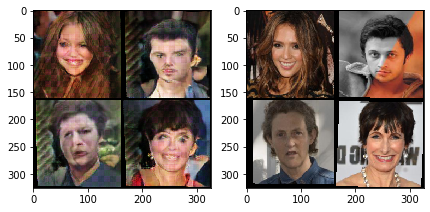

[1/2][4250/6147]	Disc/Dec Trains: 173.0/4251.0	Loss_D: 3.1533	Loss_Dec: 3.7105	Aux F1: 0.9082	Loss_Enc: 1425.0480	D(x): 0.5671	D(G(z)): 0.2497
[1/2][4500/6147]	Disc/Dec Trains: 184.0/4501.0	Loss_D: 3.1554	Loss_Dec: 3.7127	Aux F1: 0.9081	Loss_Enc: 1428.3633	D(x): 0.6349	D(G(z)): 0.1912
[1/2][4750/6147]	Disc/Dec Trains: 193.0/4751.0	Loss_D: 3.1572	Loss_Dec: 3.7077	Aux F1: 0.9082	Loss_Enc: 1427.9861	D(x): 0.6359	D(G(z)): 0.2005
[1/2][5000/6147]	Disc/Dec Trains: 202.0/5001.0	Loss_D: 3.1592	Loss_Dec: 3.7043	Aux F1: 0.9082	Loss_Enc: 1429.3774	D(x): 0.6378	D(G(z)): 0.1963
[1/2][5250/6147]	Disc/Dec Trains: 208.0/5251.0	Loss_D: 3.1636	Loss_Dec: 3.7029	Aux F1: 0.9082	Loss_Enc: 1430.9711	D(x): 0.6084	D(G(z)): 0.1949
[1/2][5500/6147]	Disc/Dec Trains: 218.0/5500.0	Loss_D: 3.1646	Loss_Dec: 3.6977	Aux F1: 0.9081	Loss_Enc: 1430.9810	D(x): 0.6620	D(G(z)): 0.2014
[1/2][5750/6147]	Disc/Dec Trains: 228.0/5750.0	Loss_D: 3.1626	Loss_Dec: 3.6975	Aux F1: 0.9081	Loss_Enc: 1430.4502	D(x): 0.6984	D(G(z)): 0.1582

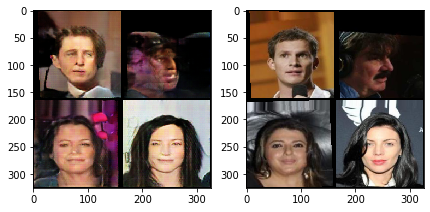

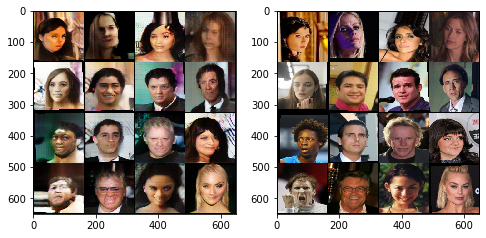

Copying file://./vaegan_resnet50_5a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

-
Operation completed over 1 objects/216.3 MiB.                                    
Copying file://./vaegan_resnet50_opt_disc_5a.pt [Content-Type=application/octet-stream]...
\
Operation completed over 1 objects/81.3 MiB.                     

In [0]:
train(net, n_epochs=2, train_loader=train_loader, margin=0.47, plot_images=2000)

[0/1][0/6147]	Disc/Dec Trains: 0.0/1.0	Loss_D: 3.0693	Loss_Dec: 3.7243	Aux F1: 0.9047	Loss_Enc: 1426.7839	D(x): 0.5944	D(G(z)): 0.2003
[0/1][250/6147]	Disc/Dec Trains: 12.0/251.0	Loss_D: 3.0776	Loss_Dec: 3.7641	Aux F1: 0.9095	Loss_Enc: 1406.5375	D(x): 0.6145	D(G(z)): 0.2054
[0/1][500/6147]	Disc/Dec Trains: 22.0/501.0	Loss_D: 3.0731	Loss_Dec: 3.7838	Aux F1: 0.9092	Loss_Enc: 1393.6525	D(x): 0.6574	D(G(z)): 0.2013
[0/1][750/6147]	Disc/Dec Trains: 30.0/751.0	Loss_D: 3.0848	Loss_Dec: 3.7866	Aux F1: 0.9092	Loss_Enc: 1395.2275	D(x): 0.5960	D(G(z)): 0.2070
[0/1][1000/6147]	Disc/Dec Trains: 36.0/1001.0	Loss_D: 3.0791	Loss_Dec: 3.7767	Aux F1: 0.9095	Loss_Enc: 1394.5631	D(x): 0.5904	D(G(z)): 0.2614
[0/1][1250/6147]	Disc/Dec Trains: 44.0/1251.0	Loss_D: 3.0841	Loss_Dec: 3.7647	Aux F1: 0.9097	Loss_Enc: 1396.9108	D(x): 0.6334	D(G(z)): 0.2045
[0/1][1500/6147]	Disc/Dec Trains: 53.0/1501.0	Loss_D: 3.0818	Loss_Dec: 3.7687	Aux F1: 0.9097	Loss_Enc: 1399.3964	D(x): 0.6398	D(G(z)): 0.1698
[0/1][1750/6147]	Di

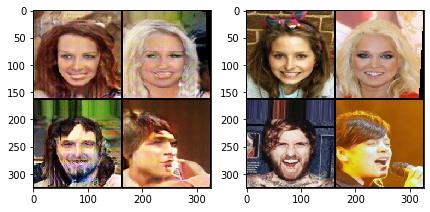

[0/1][2250/6147]	Disc/Dec Trains: 73.0/2251.0	Loss_D: 3.0952	Loss_Dec: 3.7648	Aux F1: 0.9098	Loss_Enc: 1399.1551	D(x): 0.5772	D(G(z)): 0.2479
[0/1][2500/6147]	Disc/Dec Trains: 80.0/2501.0	Loss_D: 3.1010	Loss_Dec: 3.7469	Aux F1: 0.9098	Loss_Enc: 1400.1603	D(x): 0.5808	D(G(z)): 0.2356
[0/1][2750/6147]	Disc/Dec Trains: 82.0/2751.0	Loss_D: 3.1186	Loss_Dec: 3.7295	Aux F1: 0.9097	Loss_Enc: 1400.6335	D(x): 0.5187	D(G(z)): 0.3267
[0/1][3000/6147]	Disc/Dec Trains: 88.0/3001.0	Loss_D: 3.1270	Loss_Dec: 3.7069	Aux F1: 0.9098	Loss_Enc: 1400.4952	D(x): 0.6125	D(G(z)): 0.2185
[0/1][3250/6147]	Disc/Dec Trains: 95.0/3251.0	Loss_D: 3.1270	Loss_Dec: 3.7010	Aux F1: 0.9099	Loss_Enc: 1401.3597	D(x): 0.5833	D(G(z)): 0.2709
[0/1][3500/6147]	Disc/Dec Trains: 103.0/3501.0	Loss_D: 3.1239	Loss_Dec: 3.7014	Aux F1: 0.9099	Loss_Enc: 1403.0445	D(x): 0.5497	D(G(z)): 0.2228
[0/1][3750/6147]	Disc/Dec Trains: 109.0/3751.0	Loss_D: 3.1253	Loss_Dec: 3.6989	Aux F1: 0.9100	Loss_Enc: 1405.6998	D(x): 0.5862	D(G(z)): 0.2421
[0/1

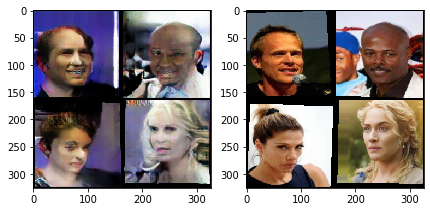

Interrupting... Saving model...
Copying file://./vaegan_resnet50_5a.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/216.3 MiB.                                    
Copying file://./vaegan_resnet50_opt_disc_5a.pt [Content-Type=application/octet-stream]...
|
Operation completed over 1 object

In [0]:
train(net, n_epochs=1, train_loader=train_loader, margin=0.47, plot_images=2000) 

In [0]:
train(net, n_epochs=1, train_loader=train_loader, margin=0.47, plot_images=2000)

[0/1][0/6147]	Disc/Dec Trains: 0.0/1.0	Loss_D: 1.0443	Loss_Dec: 4.0371	Aux F1: 0.9038	Loss_Enc: 1510.2410	D(x): 0.6819	D(G(z)): 0.1992
[0/1][250/6147]	Disc/Dec Trains: 4.0/251.0	Loss_D: 1.3425	Loss_Dec: 3.5875	Aux F1: 0.9109	Loss_Enc: 1432.7450	D(x): 0.5788	D(G(z)): 0.2863


In [0]:
for pg in optimizer_encoder.param_groups:
    print(pg['lr'])

8e-05


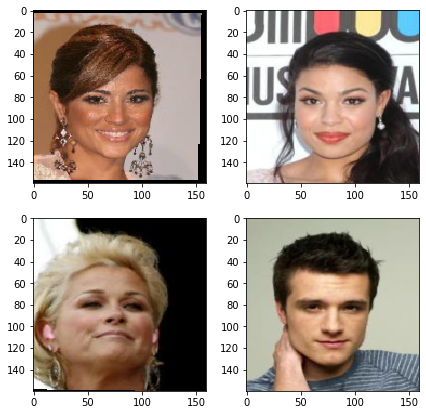

Pred Attrs 1: Index(['Arched_Eyebrows', 'Attractive', 'Bangs', 'Heavy_Makeup',
       'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Pointy_Nose',
       'Smiling', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young'],
      dtype='object')
GT Attrs 1: Index(['Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bangs',
       'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard',
       'Rosy_Cheeks', 'Smiling', 'Wearing_Earrings', 'Wearing_Lipstick',
       'Wearing_Necklace', 'Young'],
      dtype='object')

Pred Attrs 2: Index(['Arched_Eyebrows', 'Attractive', 'Big_Lips', 'Black_Hair',
       'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Rosy_Cheeks', 'Smiling',
       'Wearing_Earrings', 'Wearing_Lipstick', 'Young'],
      dtype='object')
GT Attrs 2: Index(['Arched_Eyebrows', 'Attractive', 'Big_Lips', 'Black_Hair', 'Chubby',
       'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Oval_Face', 'Smiling',
       'Wavy_Hair', 'Wearing_Lipstick', 'Young'],
      dtyp

In [0]:
with torch.no_grad():
    for (inputs, b_labels) in train_loader:
#     inputs, labels = next(iter(train_loader))
        inputs = inputs.cuda()
        
        output, out_labels, classes, fm_r, mus, variances = net(inputs)

        # get the predicted attributes
        preds = torch.round(classes).squeeze().detach().cpu().numpy()        
        
        image_1_attrs = image_labels.columns[1:][preds[0] == 1]
        image_2_attrs = image_labels.columns[1:][preds[1] == 1]
        image_3_attrs = image_labels.columns[1:][preds[2] == 1]
        image_4_attrs = image_labels.columns[1:][preds[3] == 1]
        
        b_labels = b_labels.detach().cpu().numpy()
        image_1_gt = image_labels.columns[1:][b_labels[0] == 1]
        image_2_gt = image_labels.columns[1:][b_labels[1] == 1]
        image_3_gt = image_labels.columns[1:][b_labels[2] == 1]
        image_4_gt = image_labels.columns[1:][b_labels[3] == 1]
        
        inputs = (inputs * 0.5) + 0.5
        fig, ax = plt.subplots(2, 2, figsize=(7,7))
        ax[0,0].imshow(inputs[0].detach().cpu().permute(1,2,0))
        ax[0,1].imshow(inputs[1].detach().cpu().permute(1,2,0))
        ax[1,0].imshow(inputs[2].detach().cpu().permute(1,2,0))
        ax[1,1].imshow(inputs[3].detach().cpu().permute(1,2,0))
        plt.show()   
        
        print("Pred Attrs 1:", image_1_attrs)
        print("GT Attrs 1:", image_1_gt)
        print()
        print("Pred Attrs 2:", image_2_attrs)
        print("GT Attrs 2:", image_2_gt)
        print()
        print("Pred Attrs 3:", image_3_attrs)
        print("GT Attrs 3:", image_3_gt)
        print()
        print("Pred Attrs 4:", image_4_attrs)
        print("GT Attrs 4:", image_4_gt)
        print()
        break

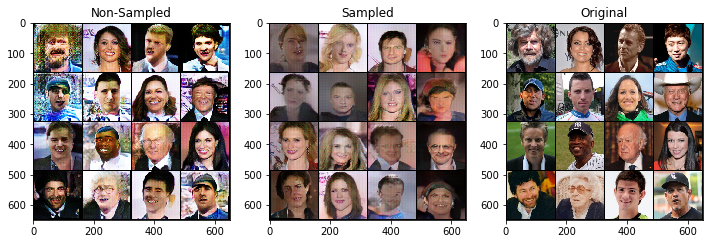

In [0]:
with torch.no_grad():
    net.eval()
    inputs, _ = next(iter(test_loader))
    inputs = inputs.cuda()
    
    fake = net(inputs, output_samples=False)
    
    train_batch = inputs.shape[0]
    
    decoded = fake[:train_batch]
    # out_layer_original = fake[train_batch:-train_batch]
    sampled = fake[train_batch:]
    
    fig, ax = plt.subplots(1, 3, figsize=(12,12))
    ax[0].imshow(np.transpose(vutils.make_grid(decoded.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0].set_title("Non-Sampled")
    ax[1].imshow(np.transpose(vutils.make_grid(sampled.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1].set_title("Sampled")
    ax[2].imshow(np.transpose(vutils.make_grid(inputs.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[2].set_title("Original")
    plt.show()   

# print("Code mean:", code.mean().item())
# print("Code max:", code.max().item())
# print("Code min:", code.min().item())
# print("Code var:", code.var().item())
# print()

# # print("SCode mean:", code_s.mean().item())
# # print("SCode max:", code_s.max().item())
# # print("SCode min:", code_s.min().item())
# # print("SCode var:", code_s.var().item())
# # print()

# print("Logvar mean:", logvar.mean().item())
# print("Logvar var:", logvar.var().item())
# print("Logvar Exp:", logvar.exp().mean().item())

In [0]:
print(fake.shape)
print(inputs.shape)

torch.Size([128, 3, 160, 160])
torch.Size([64, 3, 160, 160])


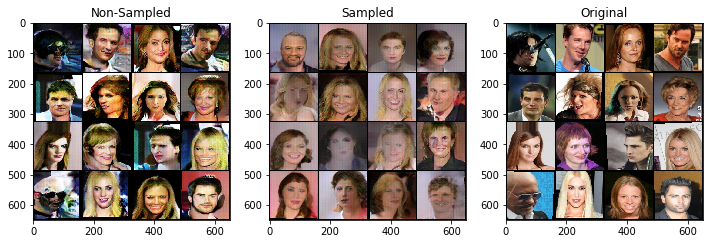

In [0]:
with torch.no_grad():
    net.eval()
    inputs, _ = next(iter(train_loader))
    inputs = inputs.cuda()
    
    fake = net(inputs, output_samples=False)
    
    train_batch = inputs.shape[0]
    
    out_layer_predicted = fake[:train_batch]
    out_layer_sampled = fake[train_batch:]
    
    fig, ax = plt.subplots(1, 3, figsize=(12,12))
    ax[0].imshow(np.transpose(vutils.make_grid(out_layer_predicted.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0].set_title("Non-Sampled")
    ax[1].imshow(np.transpose(vutils.make_grid(out_layer_sampled.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1].set_title("Sampled")
    ax[2].imshow(np.transpose(vutils.make_grid(inputs.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[2].set_title("Original")
    plt.show()   

# print("Code mean:", code.mean().item())
# print("Code max:", code.max().item())
# print("Code min:", code.min().item())
# print("Code var:", code.var().item())
# print()

# # print("SCode mean:", code_s.mean().item())
# # print("SCode max:", code_s.max().item())
# # print("SCode min:", code_s.min().item())
# # print("SCode var:", code_s.var().item())
# # print()

# print("Logvar mean:", logvar.mean().item())
# print("Logvar var:", logvar.var().item())
# print("Logvar Exp:", logvar.exp().mean().item())

## Old Code - do not execute

In [0]:
# decay_mse = 1
# decay_equilibrium = 1
# margin = 0.35
# equilibrium = 0.68

# def train(net, n_epochs=5, train_loader=train_loader, margin=margin, plot_images=1000):
#     lambda_mse = 1e-6
#     lambda_aux = 0.35
#     lambda_sampled = 0.5
#     decay_mse = 1
#     decay_equilibrium = 1
#     equilibrium = 0.68

#     try:
#         for i in range(n_epochs):
#             # reset rolling average
#             loss_nle_mean = RollingMeasure()
#             loss_encoder_mean = RollingMeasure()
#             loss_decoder_mean = RollingMeasure()
#             loss_discriminator_mean = RollingMeasure()
#             loss_reconstruction_layer_mean = RollingMeasure()
#             loss_kld_mean = RollingMeasure()
#             gan_gen_eq_mean = RollingMeasure()
#             gan_dis_eq_mean = RollingMeasure()
#             aux_f1 = RollingMeasure()
            
#             #print("LR:{}".format(lr_encoder.get_lr()))

#             # for each batch
#             for j, (data_batch,aux_labels) in enumerate(train_loader):
#                 # set to train mode
#                 train_batch = len(data_batch)
#                 net.train()
#                 # target and input are the same images
#                 data_in = Variable(data_batch, requires_grad=False).float().cuda()
#                 data_target = data_in.clone()
#                 aux_labels = aux_labels.cuda()

#                 # get output
#                 out, out_labels, aux_out, out_layer, mus, variances = net(data_in)

#                 # split so we can get the different parts
#                 out_layer_predicted = out_layer[:train_batch]
#                 out_layer_original = out_layer[train_batch:-train_batch]
#                 out_layer_sampled = out_layer[-train_batch:]

#                 #labels
#                 out_labels_predicted = out_labels[:train_batch]
#                 out_labels_original = out_labels[train_batch:-train_batch]
#                 out_labels_sampled = out_labels[-train_batch:]
                
#                 # aux output
#                 aux_out_original = aux_out[train_batch:-train_batch]
#                 aux_out_recon = aux_out[:train_batch]
                
#                 # loss, nothing special here
#                 nle_value, kl_value, mse_value_1,mse_value_2, bce_dis_original_value, bce_dis_sampled_value, \
#                 bce_dis_predicted_value,bce_gen_sampled_value,bce_gen_predicted_value, aux_loss = VaeGan.loss(data_target, out, out_layer_original,
#                                                                               out_layer_predicted,out_layer_sampled, out_labels_original,
#                                                                               out_labels_predicted,out_labels_sampled, mus,
#                                                                               variances, aux_out_original, aux_out_recon, aux_labels)
#                 # THIS IS THE MOST IMPORTANT PART OF THE CODE
#                 loss_encoder = torch.sum(kl_value) + torch.sum(mse_value_1) # + torch.sum(mse_value_2)
#                 loss_discriminator = torch.sum(bce_dis_original_value) + torch.sum(bce_dis_sampled_value) + torch.sum(bce_dis_predicted_value) + (lambda_aux * aux_loss)
#                 loss_decoder = (torch.sum(bce_gen_sampled_value) * lambda_sampled) + torch.sum(bce_gen_predicted_value)
#                 loss_decoder = torch.sum(lambda_mse / 2 * mse_value_1) + ((1.0 - lambda_mse) * loss_decoder) # + torch.sum(lambda_mse * mse_value_2 * 0.5)

#                 # register mean values of the losses for logging
#                 loss_nle_mean(0)
#                 loss_discriminator_mean((torch.mean(bce_dis_original_value) + torch.mean(bce_dis_sampled_value)).cpu().item())
#                 loss_decoder_mean((torch.mean(lambda_mse * mse_value_1 / 2) + (1 - lambda_mse) * (torch.mean(bce_gen_predicted_value) + torch.mean(bce_gen_sampled_value) * lambda_sampled)).cpu().item()) # torch.mean(lambda_aux * mse_value_2 * 0.5) + 

#                 aux_f1(masked_accuracy(aux_out_original, aux_labels))

#                 loss_encoder_mean(kl_value.mean().item() + mse_value_1.mean().item() ) # + mse_value_2.mean().item()
#                 loss_reconstruction_layer_mean((torch.mean(mse_value_1) + torch.mean(mse_value_2)).cpu().item())
#                 loss_kld_mean(torch.mean(kl_value).data.cpu().item())
                
#                 # selectively disable the decoder of the discriminator if they are unbalanced
#                 train_dis = True
#                 train_dec = True
                
#                 if torch.mean(bce_dis_original_value).item() < equilibrium-margin or torch.mean(bce_dis_sampled_value).item() < equilibrium-margin:
#                     train_dis = False
#                 if torch.mean(bce_dis_original_value).item() > equilibrium+margin or torch.mean(bce_dis_sampled_value).item() > equilibrium+margin:
#                     train_dec = False
#                 if train_dec is False and train_dis is False:
#                     train_dis = True
#                     train_dec = True

#                 #aggiungo log
#                 if train_dis:
#                     gan_dis_eq_mean(1.0)
#                 else:
#                     gan_dis_eq_mean(0.0)

#                 if train_dec:
#                     gan_gen_eq_mean(1.0)
#                 else:
#                     gan_gen_eq_mean(0.0)

#                 # BACKPROP
#                 # clean grads
#                 net.zero_grad()
#                 # encoder
#                 loss_encoder.backward(retain_graph=True)
#                 # someone likes to clamp the grad here
#                 #[p.grad.data.clamp_(-1,1) for p in net.encoder.parameters()]
#                 # update parameters
#                 optimizer_encoder.step()
#                 # clean others, so they are not afflicted by encoder loss
#                 net.zero_grad()
#                 #decoder
#                 if train_dec:
#                     loss_decoder.backward(retain_graph=True)
#                     #[p.grad.data.clamp_(-1,1) for p in net.decoder.parameters()]
#                     optimizer_decoder.step()
#                     #clean the discriminator
#                     net.discriminator.zero_grad()
#                 #discriminator
#                 if train_dis:
#                     loss_discriminator.backward()
#                     #[p.grad.data.clamp_(-1,1) for p in net.discriminator.parameters()]
#                     optimizer_discriminator.step()

#                 if j % 100 == 0:
#                     print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_Dec: %.4f\tAux F1: %.4f\tLoss_Enc: %.4f\tD(x): %.4f\tD(G(z)): %.4f'
#                           % (i, n_epochs, j, len(train_loader),
#                               loss_discriminator_mean.measure,  loss_decoder_mean.measure, aux_f1.measure, loss_encoder_mean.measure, out_labels_original.mean().item(), out_labels_predicted.mean().item()))
#                 if j % plot_images == 0 and j > 0:
#                     with torch.no_grad():
#                         out = (out * 0.5) + 0.5
#                         fig, ax = plt.subplots(1, 2, figsize=(7,7))
#                         ax[0].imshow(np.transpose(vutils.make_grid(out[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
#                         ax[1].imshow(np.transpose(vutils.make_grid(data_in[:4].detach().cpu(), nrow=2, padding=2, normalize=True),(1,2,0)))
#                         plt.show()

#             torch.save(net.state_dict(), model_save_path)
#             torch.save(optimizer_discriminator.state_dict(), disc_opt_save_path)
#             torch.save(optimizer_decoder.state_dict(), dec_opt_save_path)
#             torch.save(optimizer_encoder.state_dict(), enc_opt_save_path)

#             lr_encoder.step()
#             lr_decoder.step()
#             lr_discriminator.step()
#             margin *=decay_margin
#             equilibrium *=decay_equilibrium
#             #margin non puo essere piu alto di equilibrium
#             if margin > equilibrium:
#                 equilibrium = margin
#             lambda_mse *=decay_mse
#             if lambda_mse > 1:
#                 lambda_mse=1

#             # plot some sample images
#             fig, ax = plt.subplots(1, 2, figsize=(8,8))
#             out = (out * 0.5) + 0.5
#             ax[0].imshow(np.transpose(vutils.make_grid(out.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
#             ax[1].imshow(np.transpose(vutils.make_grid(data_batch.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
#             plt.show()   
            
#     except KeyboardInterrupt:
#         print("Interrupting... Saving model...")
#         torch.save(net.state_dict(), model_save_path)
#         torch.save(optimizer_discriminator.state_dict(), disc_opt_save_path)
#         torch.save(optimizer_decoder.state_dict(), dec_opt_save_path)
#         torch.save(optimizer_encoder.state_dict(), enc_opt_save_path)